## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('../input/cs231n-gan/gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

11493376/11490434 [==============================] - 1s 0us/step


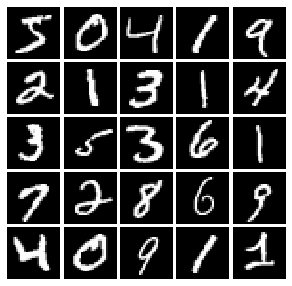

In [3]:
# show a batch
mnist = MNIST(batch_size=25) 
show_images(mnist.X[:25])

## LeakyReLU

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    x = tf.nn.leaky_relu(x,alpha)
    return x
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 1.11759e-08


## Random Noise

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    noise = tf.random.uniform([batch_size,dim],minval = -1,maxval = 1)
    return noise
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator

In [8]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [9]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator

In [10]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(noise_dim),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(1024),
        tf.keras.layers.ReLU(),
        tf.keras.layers.Dense(784,activation = tf.nn.tanh)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [11]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

In [12]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    real_loss = cross_entropy(tf.ones_like(logits_real), logits_real)
    fake_loss = cross_entropy(tf.zeros_like(logits_fake), logits_fake)
    loss = real_loss + fake_loss
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = cross_entropy(tf.ones_like(logits_fake), logits_fake)
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [13]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [14]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss

In [15]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    D_solver = tf.optimizers.Adam(learning_rate,beta1)
    G_solver = tf.optimizers.Adam(learning_rate,beta1)
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN

In [16]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN

Epoch: 0, Iter: 0, D: 1.519, G:0.7227


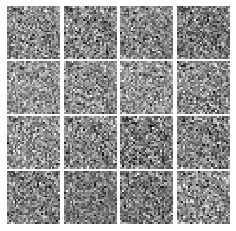

Epoch: 0, Iter: 20, D: 0.6118, G:0.9158


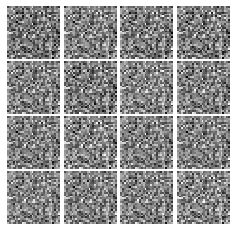

Epoch: 0, Iter: 40, D: 0.4478, G:1.093


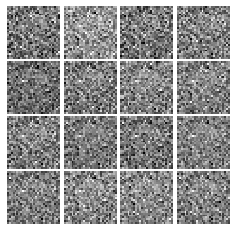

Epoch: 0, Iter: 60, D: 5.089, G:0.5487


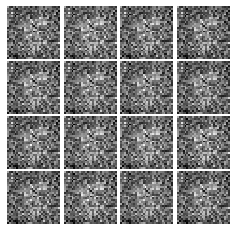

Epoch: 0, Iter: 80, D: 1.467, G:1.304


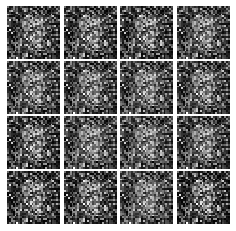

Epoch: 0, Iter: 100, D: 1.544, G:1.489


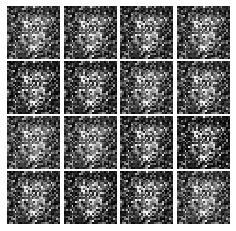

Epoch: 0, Iter: 120, D: 1.184, G:1.294


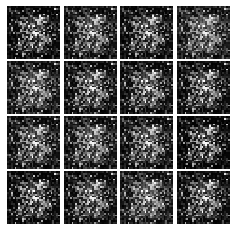

Epoch: 0, Iter: 140, D: 1.257, G:1.437


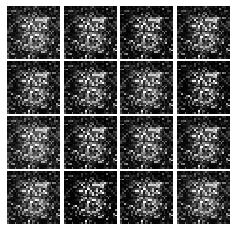

Epoch: 0, Iter: 160, D: 1.559, G:1.382


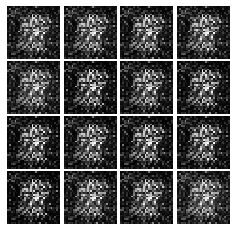

Epoch: 0, Iter: 180, D: 1.414, G:1.059


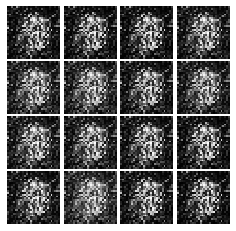

Epoch: 0, Iter: 200, D: 1.812, G:0.378


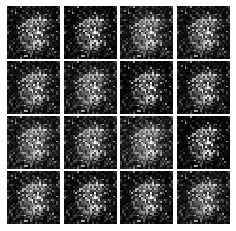

Epoch: 0, Iter: 220, D: 1.535, G:0.9696


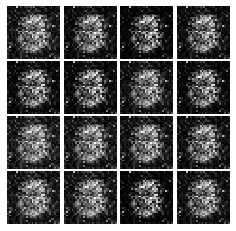

Epoch: 0, Iter: 240, D: 2.313, G:0.3283


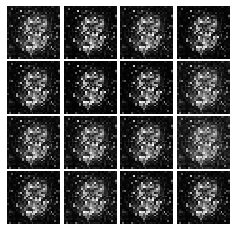

Epoch: 0, Iter: 260, D: 1.266, G:0.8343


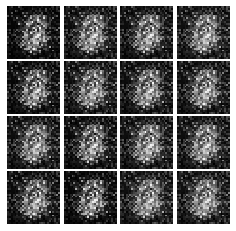

Epoch: 0, Iter: 280, D: 2.065, G:1.894


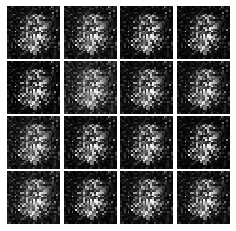

Epoch: 0, Iter: 300, D: 1.538, G:1.097


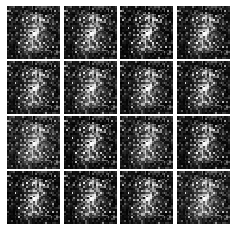

Epoch: 0, Iter: 320, D: 1.583, G:1.618


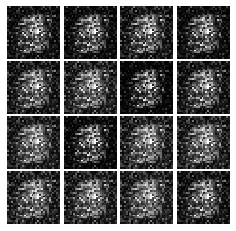

Epoch: 0, Iter: 340, D: 1.418, G:1.482


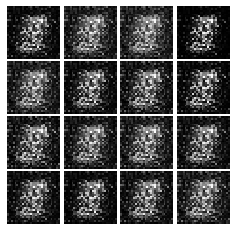

Epoch: 0, Iter: 360, D: 0.8074, G:2.582


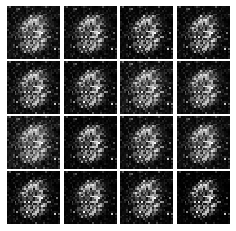

Epoch: 0, Iter: 380, D: 0.6782, G:2.094


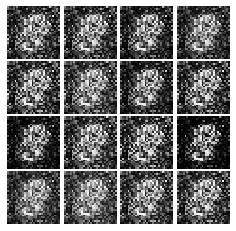

Epoch: 0, Iter: 400, D: 0.8603, G:1.709


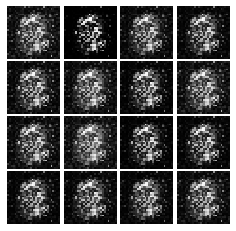

Epoch: 0, Iter: 420, D: 0.8352, G:1.461


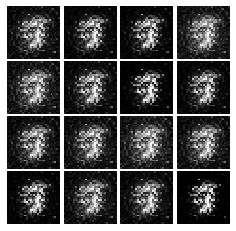

Epoch: 0, Iter: 440, D: 0.7874, G:1.545


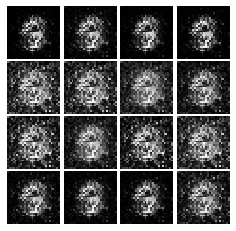

Epoch: 0, Iter: 460, D: 1.154, G:2.36


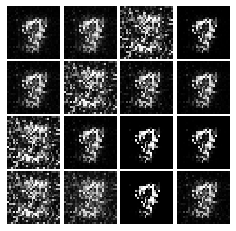

Epoch: 1, Iter: 480, D: 0.8029, G:2.292


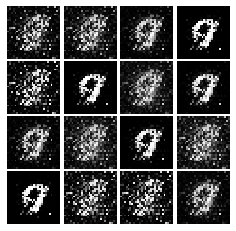

Epoch: 1, Iter: 500, D: 1.39, G:0.671


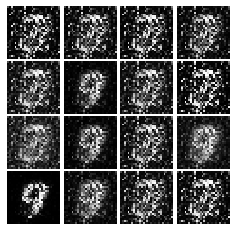

Epoch: 1, Iter: 520, D: 0.603, G:2.928


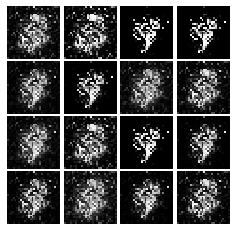

Epoch: 1, Iter: 540, D: 0.9187, G:1.644


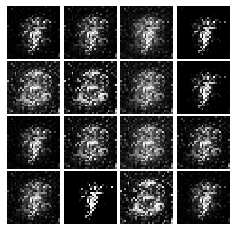

Epoch: 1, Iter: 560, D: 0.9639, G:1.616


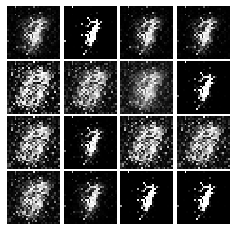

Epoch: 1, Iter: 580, D: 1.312, G:0.5464


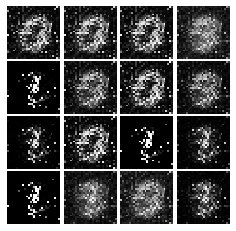

Epoch: 1, Iter: 600, D: 1.081, G:1.326


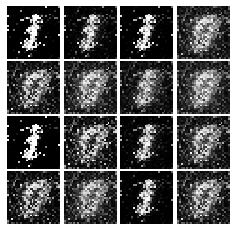

Epoch: 1, Iter: 620, D: 0.9572, G:1.882


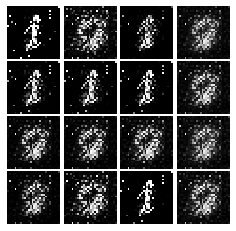

Epoch: 1, Iter: 640, D: 0.9519, G:1.558


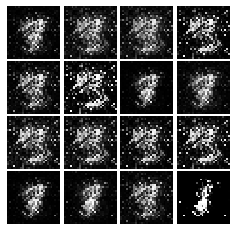

Epoch: 1, Iter: 660, D: 0.9431, G:1.081


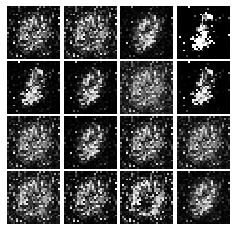

Epoch: 1, Iter: 680, D: 0.8286, G:1.537


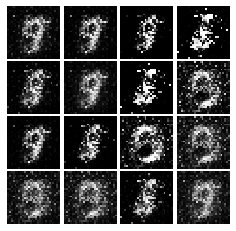

Epoch: 1, Iter: 700, D: 1.05, G:1.069


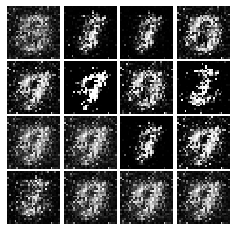

Epoch: 1, Iter: 720, D: 1.226, G:1.126


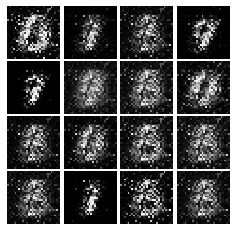

Epoch: 1, Iter: 740, D: 2.368, G:3.256


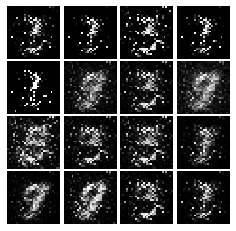

Epoch: 1, Iter: 760, D: 0.8149, G:1.826


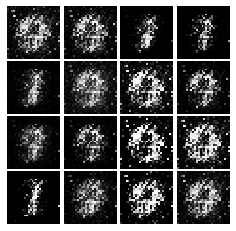

Epoch: 1, Iter: 780, D: 1.264, G:0.897


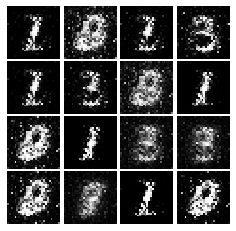

Epoch: 1, Iter: 800, D: 1.292, G:1.029


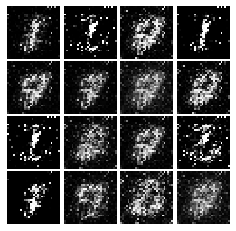

Epoch: 1, Iter: 820, D: 1.013, G:0.699


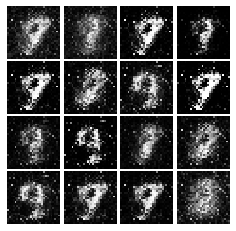

Epoch: 1, Iter: 840, D: 1.209, G:1.093


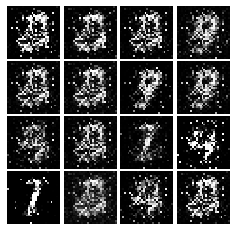

Epoch: 1, Iter: 860, D: 1.032, G:1.575


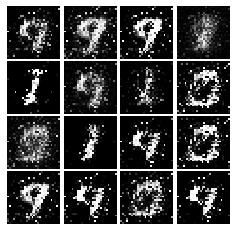

Epoch: 1, Iter: 880, D: 0.8565, G:2.523


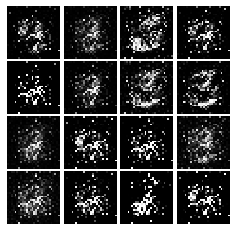

Epoch: 1, Iter: 900, D: 0.979, G:1.858


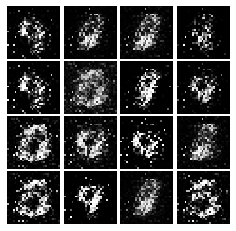

Epoch: 1, Iter: 920, D: 1.096, G:1.232


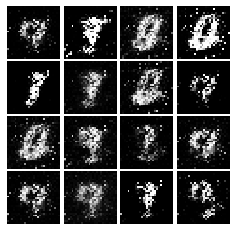

Epoch: 2, Iter: 940, D: 1.422, G:1.403


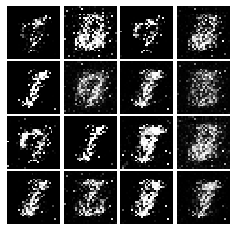

Epoch: 2, Iter: 960, D: 1.008, G:2.812


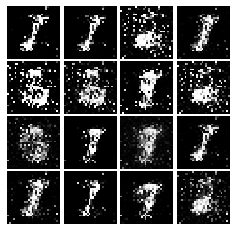

Epoch: 2, Iter: 980, D: 0.9268, G:1.899


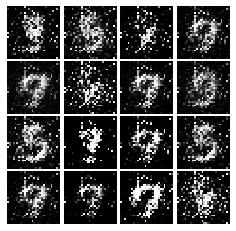

Epoch: 2, Iter: 1000, D: 0.828, G:1.735


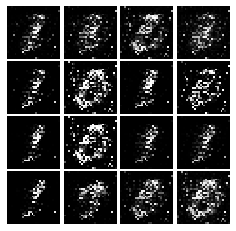

Epoch: 2, Iter: 1020, D: 1.154, G:1.449


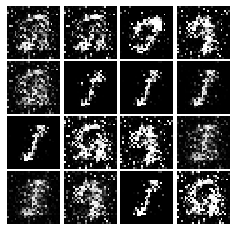

Epoch: 2, Iter: 1040, D: 1.187, G:1.237


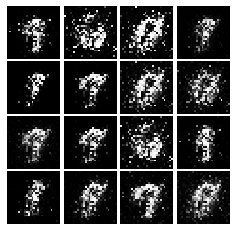

Epoch: 2, Iter: 1060, D: 0.8478, G:1.699


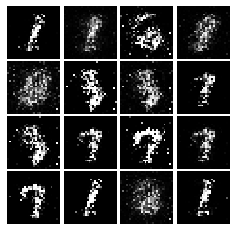

Epoch: 2, Iter: 1080, D: 0.9044, G:1.269


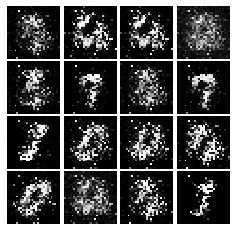

Epoch: 2, Iter: 1100, D: 1.131, G:1.391


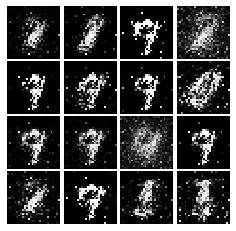

Epoch: 2, Iter: 1120, D: 1.38, G:1.084


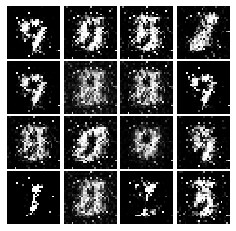

Epoch: 2, Iter: 1140, D: 1.31, G:1.147


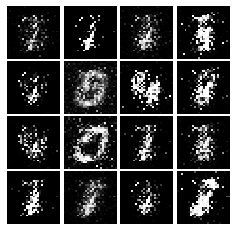

Epoch: 2, Iter: 1160, D: 1.006, G:1.352


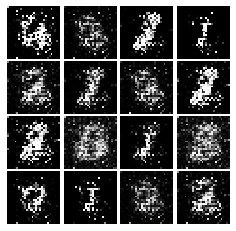

Epoch: 2, Iter: 1180, D: 0.9837, G:1.045


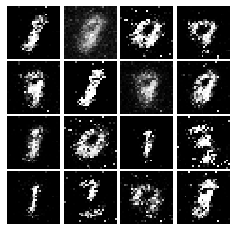

Epoch: 2, Iter: 1200, D: 1.131, G:1.339


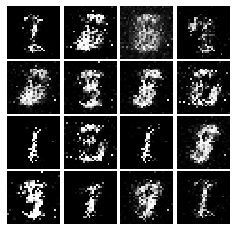

Epoch: 2, Iter: 1220, D: 1.38, G:2.459


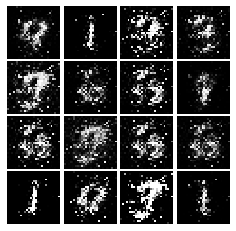

Epoch: 2, Iter: 1240, D: 1.412, G:1.179


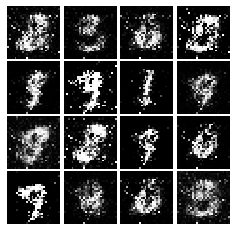

Epoch: 2, Iter: 1260, D: 1.192, G:0.9827


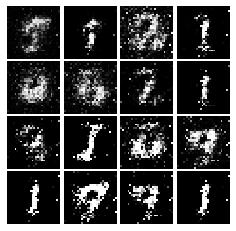

Epoch: 2, Iter: 1280, D: 1.145, G:1.289


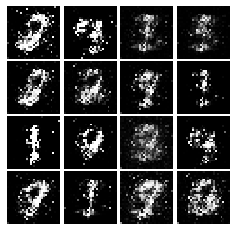

Epoch: 2, Iter: 1300, D: 1.252, G:0.9292


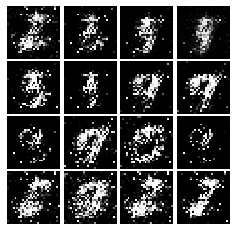

Epoch: 2, Iter: 1320, D: 1.405, G:1.1


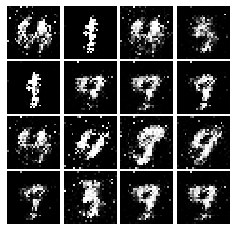

Epoch: 2, Iter: 1340, D: 1.429, G:1.281


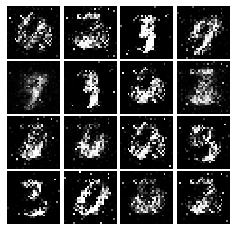

Epoch: 2, Iter: 1360, D: 1.173, G:1.054


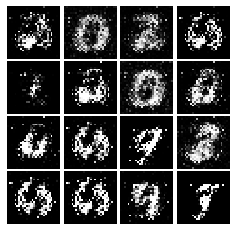

Epoch: 2, Iter: 1380, D: 1.217, G:1.07


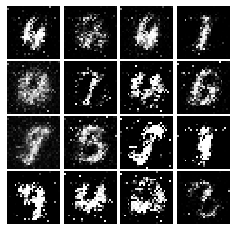

Epoch: 2, Iter: 1400, D: 1.485, G:0.9167


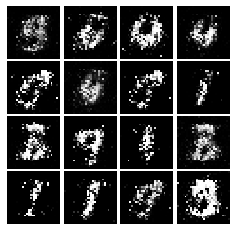

Epoch: 3, Iter: 1420, D: 1.131, G:0.9589


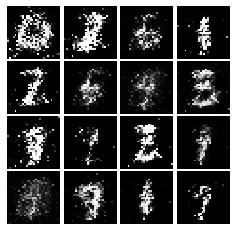

Epoch: 3, Iter: 1440, D: 1.231, G:1.042


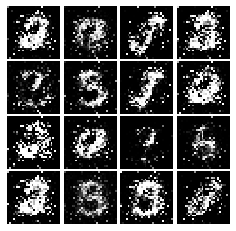

Epoch: 3, Iter: 1460, D: 1.399, G:1.182


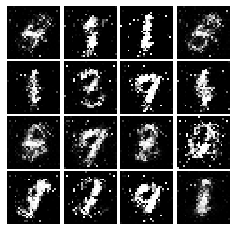

Epoch: 3, Iter: 1480, D: 1.298, G:0.9191


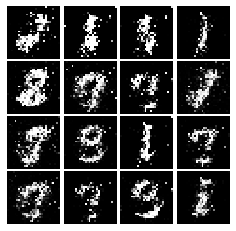

Epoch: 3, Iter: 1500, D: 1.33, G:0.6045


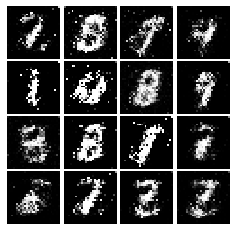

Epoch: 3, Iter: 1520, D: 1.183, G:1.008


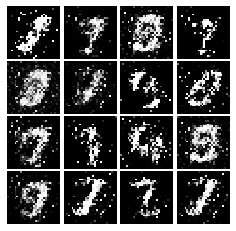

Epoch: 3, Iter: 1540, D: 1.092, G:1.326


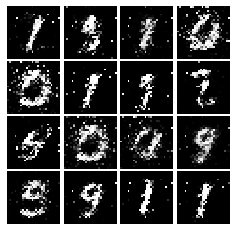

Epoch: 3, Iter: 1560, D: 1.268, G:0.924


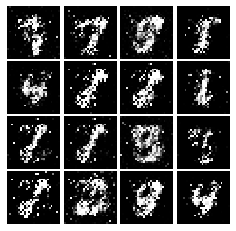

Epoch: 3, Iter: 1580, D: 1.188, G:0.7486


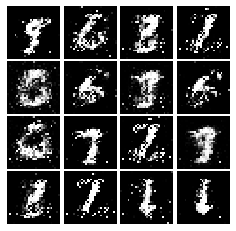

Epoch: 3, Iter: 1600, D: 1.331, G:0.8636


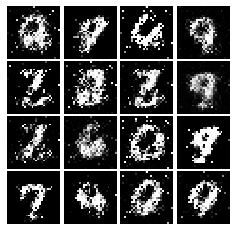

Epoch: 3, Iter: 1620, D: 1.255, G:1.048


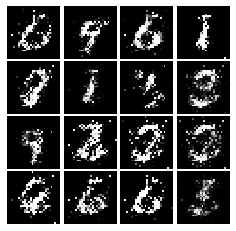

Epoch: 3, Iter: 1640, D: 1.214, G:1.328


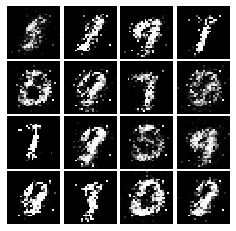

Epoch: 3, Iter: 1660, D: 1.188, G:0.9652


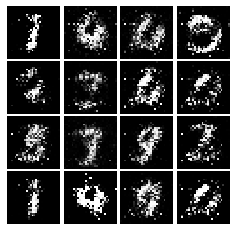

Epoch: 3, Iter: 1680, D: 1.215, G:0.8578


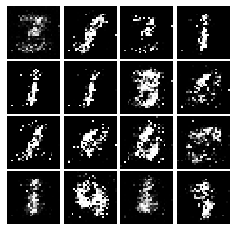

Epoch: 3, Iter: 1700, D: 1.555, G:0.883


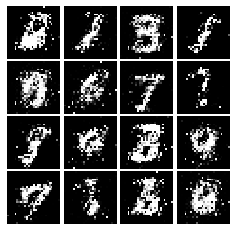

Epoch: 3, Iter: 1720, D: 1.175, G:0.9877


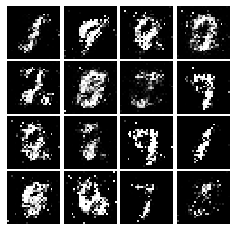

Epoch: 3, Iter: 1740, D: 1.281, G:0.9383


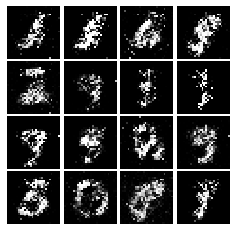

Epoch: 3, Iter: 1760, D: 1.222, G:1.164


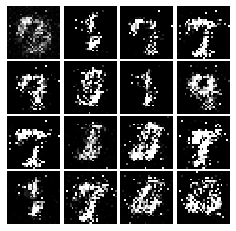

Epoch: 3, Iter: 1780, D: 1.127, G:1.206


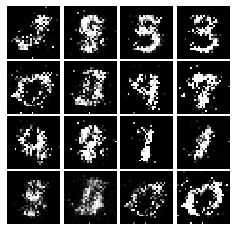

Epoch: 3, Iter: 1800, D: 1.157, G:1.164


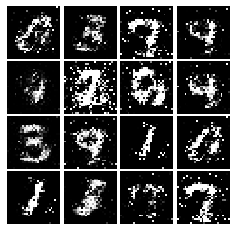

Epoch: 3, Iter: 1820, D: 1.277, G:0.9883


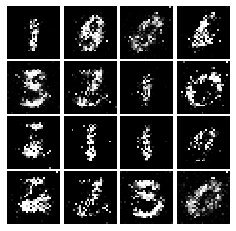

Epoch: 3, Iter: 1840, D: 1.299, G:1.199


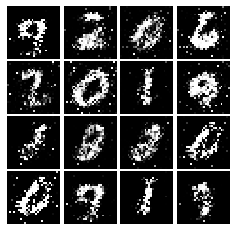

Epoch: 3, Iter: 1860, D: 1.326, G:1.081


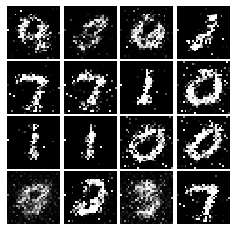

Epoch: 4, Iter: 1880, D: 1.303, G:0.3132


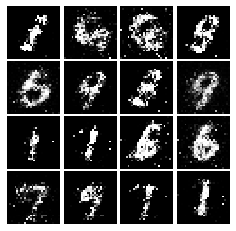

Epoch: 4, Iter: 1900, D: 1.412, G:0.8773


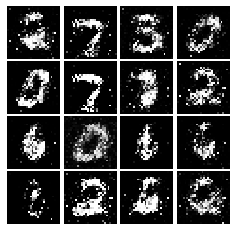

Epoch: 4, Iter: 1920, D: 1.107, G:1.068


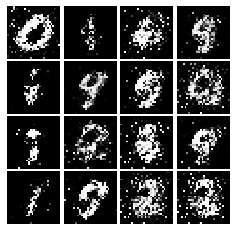

Epoch: 4, Iter: 1940, D: 1.209, G:1.276


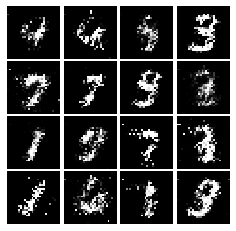

Epoch: 4, Iter: 1960, D: 1.229, G:1.037


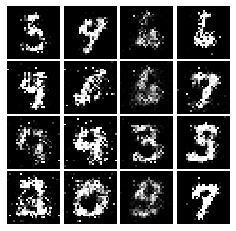

Epoch: 4, Iter: 1980, D: 1.197, G:1.022


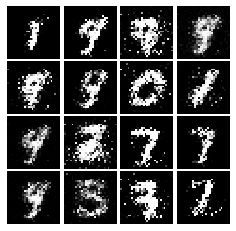

Epoch: 4, Iter: 2000, D: 1.322, G:1.224


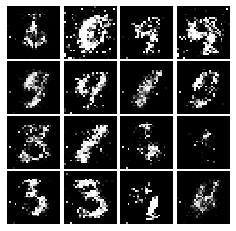

Epoch: 4, Iter: 2020, D: 1.206, G:1.078


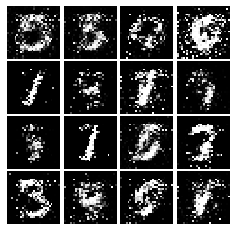

Epoch: 4, Iter: 2040, D: 1.167, G:0.9666


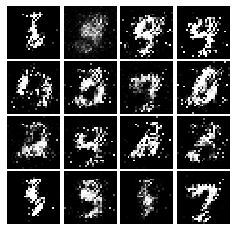

Epoch: 4, Iter: 2060, D: 1.221, G:0.9763


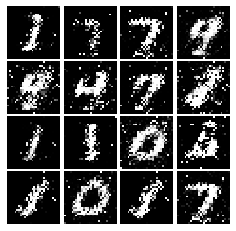

Epoch: 4, Iter: 2080, D: 1.207, G:1.15


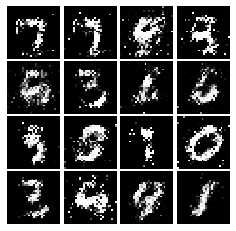

Epoch: 4, Iter: 2100, D: 1.273, G:0.9492


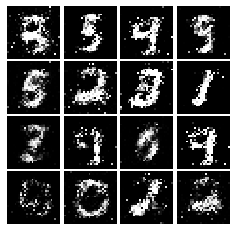

Epoch: 4, Iter: 2120, D: 1.357, G:0.7874


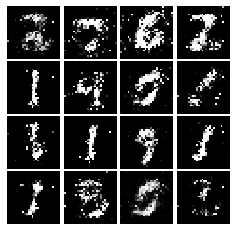

Epoch: 4, Iter: 2140, D: 2.372, G:0.5953


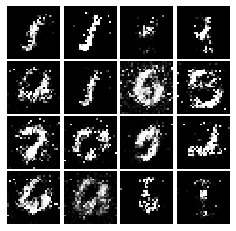

Epoch: 4, Iter: 2160, D: 1.349, G:0.7783


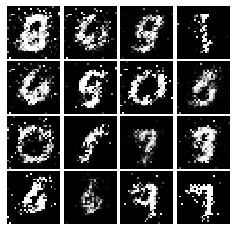

Epoch: 4, Iter: 2180, D: 1.248, G:0.8693


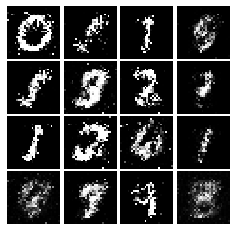

Epoch: 4, Iter: 2200, D: 1.197, G:1.006


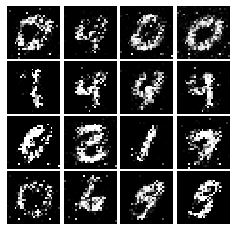

Epoch: 4, Iter: 2220, D: 1.318, G:0.9375


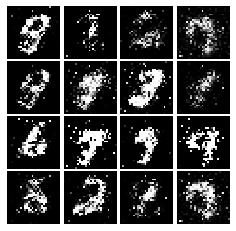

Epoch: 4, Iter: 2240, D: 1.274, G:0.8551


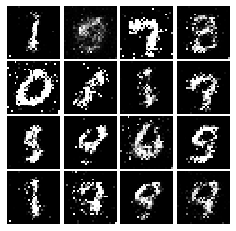

Epoch: 4, Iter: 2260, D: 1.379, G:0.6104


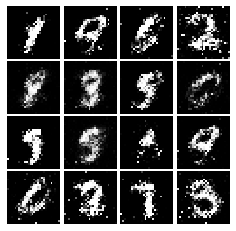

Epoch: 4, Iter: 2280, D: 1.302, G:0.9173


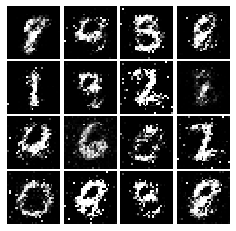

Epoch: 4, Iter: 2300, D: 1.187, G:0.9735


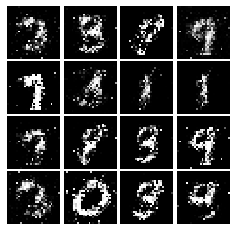

Epoch: 4, Iter: 2320, D: 1.384, G:1.051


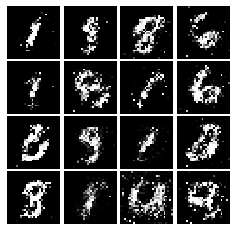

Epoch: 4, Iter: 2340, D: 1.187, G:0.9995


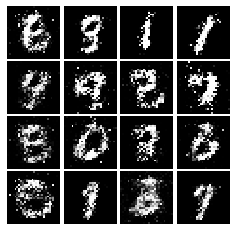

Epoch: 5, Iter: 2360, D: 1.174, G:0.9717


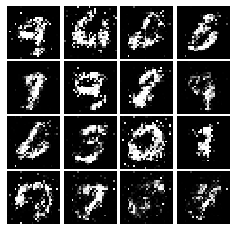

Epoch: 5, Iter: 2380, D: 1.254, G:0.8427


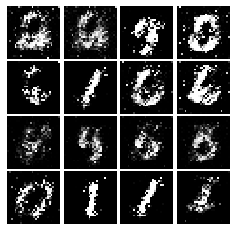

Epoch: 5, Iter: 2400, D: 1.264, G:0.9217


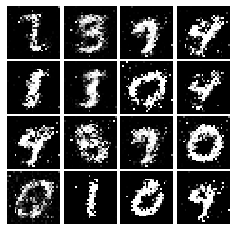

Epoch: 5, Iter: 2420, D: 1.258, G:1.054


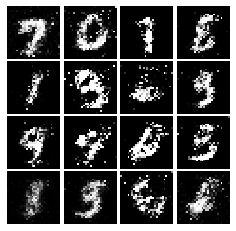

Epoch: 5, Iter: 2440, D: 1.351, G:0.7763


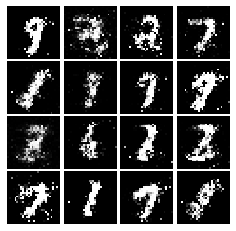

Epoch: 5, Iter: 2460, D: 1.318, G:0.974


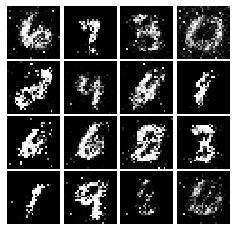

Epoch: 5, Iter: 2480, D: 1.235, G:0.8763


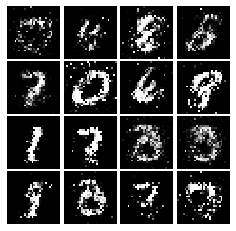

Epoch: 5, Iter: 2500, D: 1.236, G:1.035


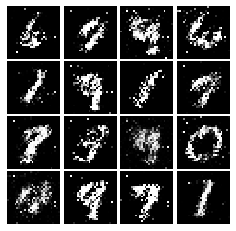

Epoch: 5, Iter: 2520, D: 1.499, G:1.021


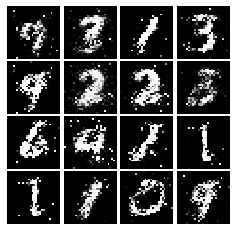

Epoch: 5, Iter: 2540, D: 1.207, G:0.9673


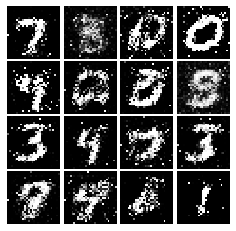

Epoch: 5, Iter: 2560, D: 1.255, G:0.8245


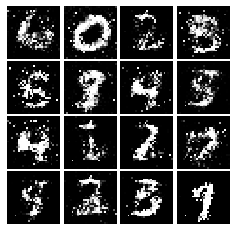

Epoch: 5, Iter: 2580, D: 1.394, G:0.9827


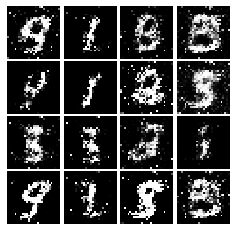

Epoch: 5, Iter: 2600, D: 1.407, G:0.9086


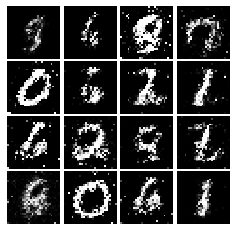

Epoch: 5, Iter: 2620, D: 1.294, G:1.02


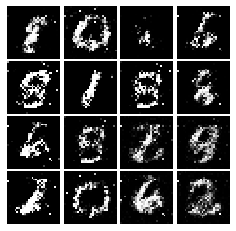

Epoch: 5, Iter: 2640, D: 1.356, G:0.8936


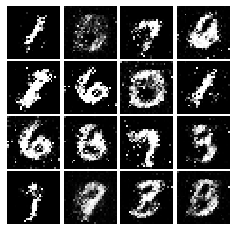

Epoch: 5, Iter: 2660, D: 1.299, G:0.9127


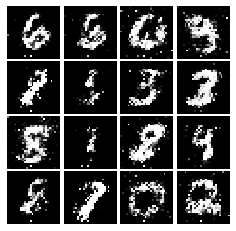

Epoch: 5, Iter: 2680, D: 1.38, G:0.7282


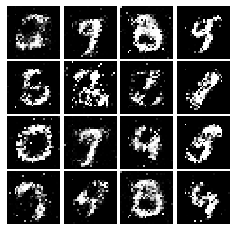

Epoch: 5, Iter: 2700, D: 1.279, G:0.8317


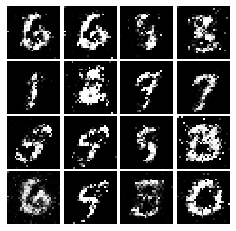

Epoch: 5, Iter: 2720, D: 1.304, G:0.8756


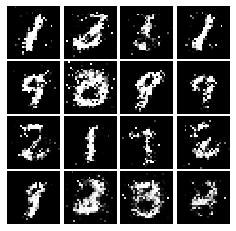

Epoch: 5, Iter: 2740, D: 1.309, G:0.8758


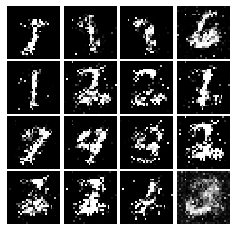

Epoch: 5, Iter: 2760, D: 1.283, G:0.7613


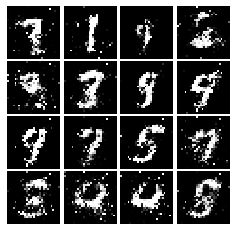

Epoch: 5, Iter: 2780, D: 1.306, G:0.8263


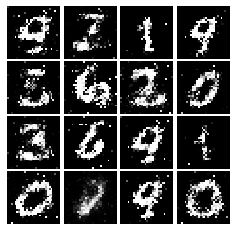

Epoch: 5, Iter: 2800, D: 1.212, G:0.919


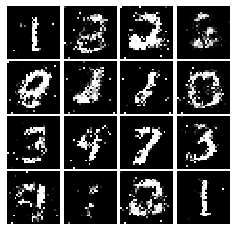

Epoch: 6, Iter: 2820, D: 1.373, G:0.7628


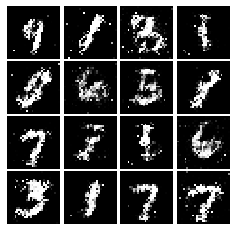

Epoch: 6, Iter: 2840, D: 1.289, G:0.7437


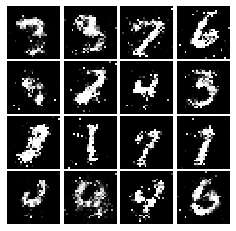

Epoch: 6, Iter: 2860, D: 1.237, G:0.9072


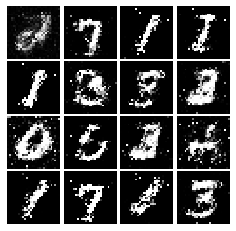

Epoch: 6, Iter: 2880, D: 1.052, G:2.155


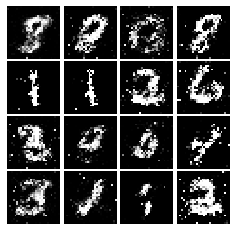

Epoch: 6, Iter: 2900, D: 1.293, G:0.9135


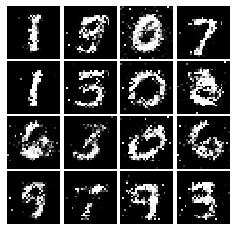

Epoch: 6, Iter: 2920, D: 1.34, G:0.7906


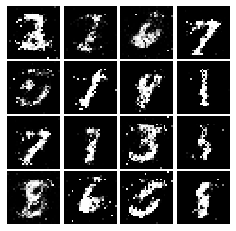

Epoch: 6, Iter: 2940, D: 1.335, G:0.7926


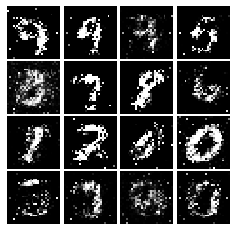

Epoch: 6, Iter: 2960, D: 1.272, G:0.9463


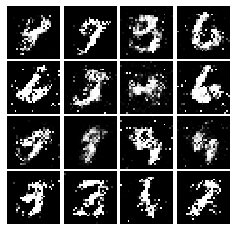

Epoch: 6, Iter: 2980, D: 1.383, G:0.9849


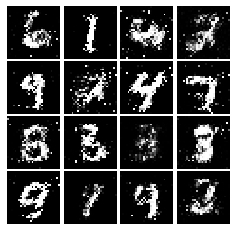

Epoch: 6, Iter: 3000, D: 1.333, G:0.8952


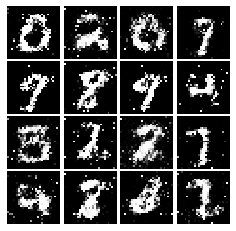

Epoch: 6, Iter: 3020, D: 1.282, G:0.812


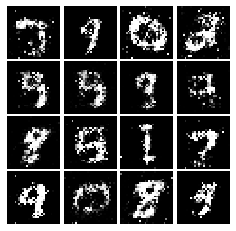

Epoch: 6, Iter: 3040, D: 1.431, G:0.8523


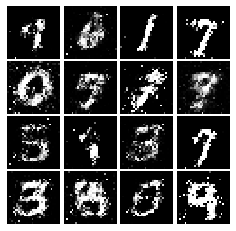

Epoch: 6, Iter: 3060, D: 1.307, G:0.8099


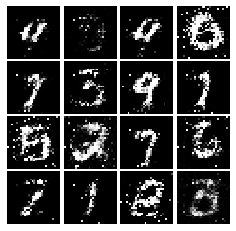

Epoch: 6, Iter: 3080, D: 1.31, G:0.768


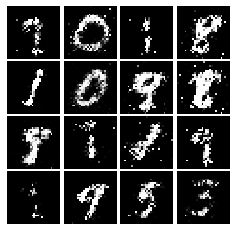

Epoch: 6, Iter: 3100, D: 1.251, G:0.9276


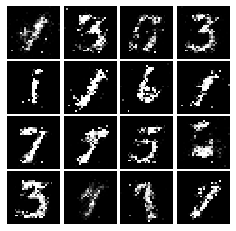

Epoch: 6, Iter: 3120, D: 1.252, G:0.825


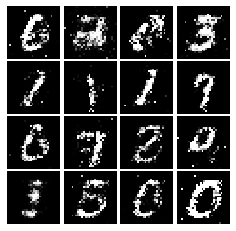

Epoch: 6, Iter: 3140, D: 1.364, G:0.8602


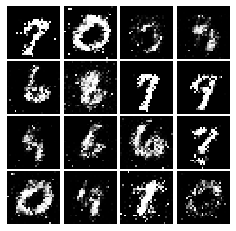

Epoch: 6, Iter: 3160, D: 1.327, G:0.936


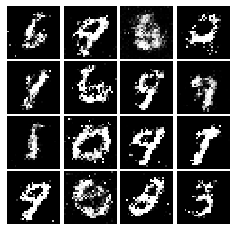

Epoch: 6, Iter: 3180, D: 1.302, G:0.8439


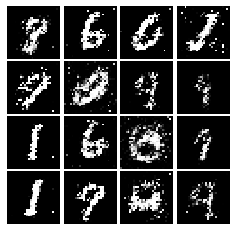

Epoch: 6, Iter: 3200, D: 1.263, G:0.8149


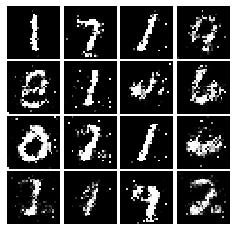

Epoch: 6, Iter: 3220, D: 1.364, G:0.8916


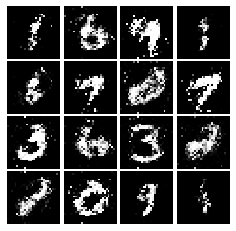

Epoch: 6, Iter: 3240, D: 1.324, G:0.7524


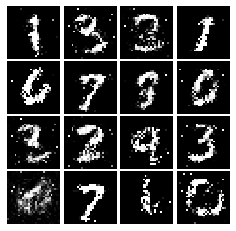

Epoch: 6, Iter: 3260, D: 1.407, G:0.8155


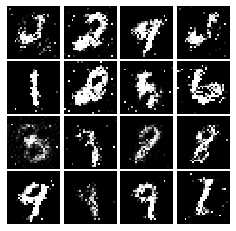

Epoch: 6, Iter: 3280, D: 1.356, G:0.8006


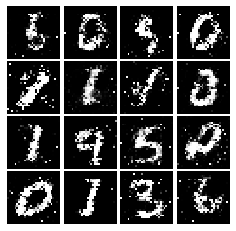

Epoch: 7, Iter: 3300, D: 1.302, G:0.8449


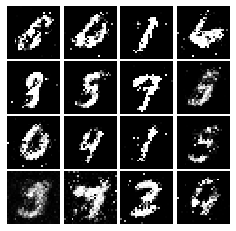

Epoch: 7, Iter: 3320, D: 1.302, G:0.7699


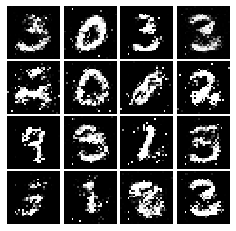

Epoch: 7, Iter: 3340, D: 1.235, G:0.8595


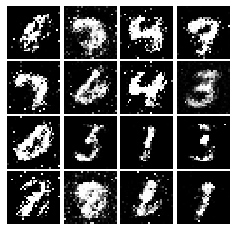

Epoch: 7, Iter: 3360, D: 1.325, G:0.9362


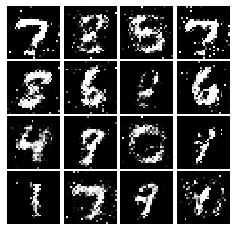

Epoch: 7, Iter: 3380, D: 1.346, G:0.782


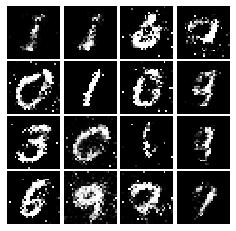

Epoch: 7, Iter: 3400, D: 1.424, G:0.8339


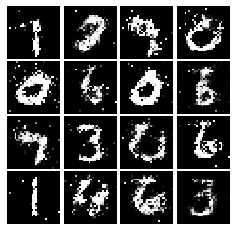

Epoch: 7, Iter: 3420, D: 1.267, G:0.8412


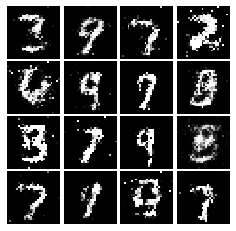

Epoch: 7, Iter: 3440, D: 1.369, G:0.8815


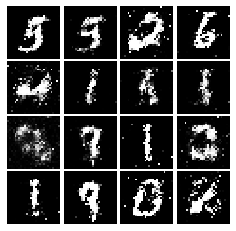

Epoch: 7, Iter: 3460, D: 1.267, G:0.7836


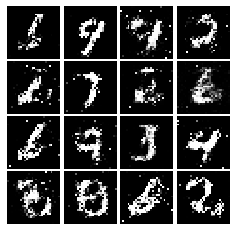

Epoch: 7, Iter: 3480, D: 1.377, G:0.8263


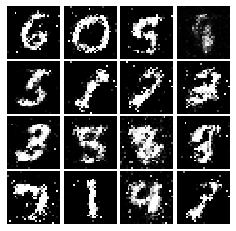

Epoch: 7, Iter: 3500, D: 1.414, G:0.634


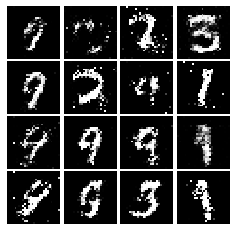

Epoch: 7, Iter: 3520, D: 1.342, G:0.7875


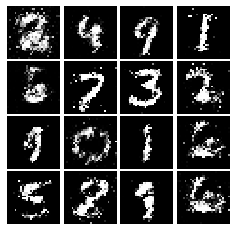

Epoch: 7, Iter: 3540, D: 1.314, G:0.79


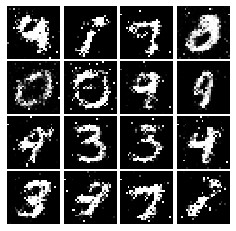

Epoch: 7, Iter: 3560, D: 1.37, G:0.8166


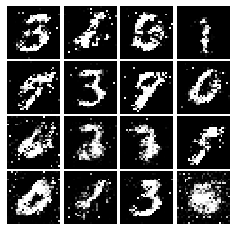

Epoch: 7, Iter: 3580, D: 1.36, G:0.836


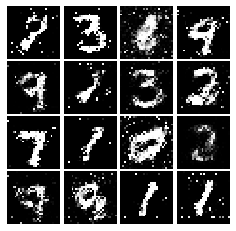

Epoch: 7, Iter: 3600, D: 1.28, G:0.8344


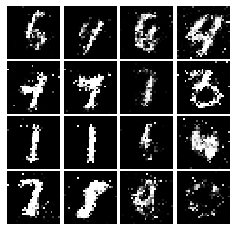

Epoch: 7, Iter: 3620, D: 1.331, G:0.8458


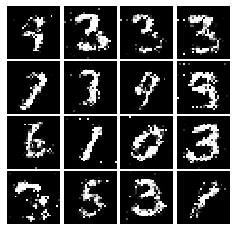

Epoch: 7, Iter: 3640, D: 1.368, G:0.8414


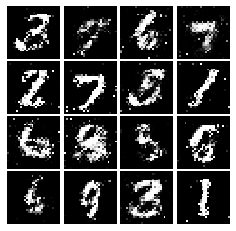

Epoch: 7, Iter: 3660, D: 1.319, G:0.8762


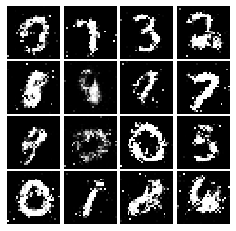

Epoch: 7, Iter: 3680, D: 1.256, G:0.7974


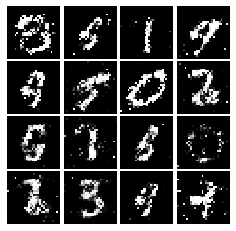

Epoch: 7, Iter: 3700, D: 1.338, G:0.8117


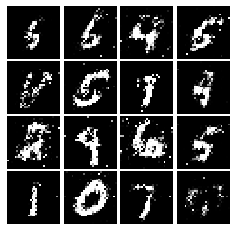

Epoch: 7, Iter: 3720, D: 1.281, G:0.8464


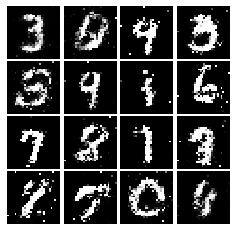

Epoch: 7, Iter: 3740, D: 1.325, G:0.849


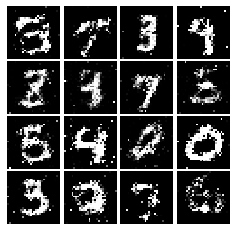

Epoch: 8, Iter: 3760, D: 1.358, G:1.019


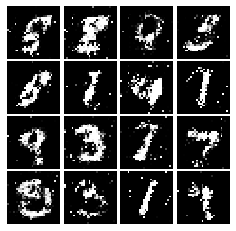

Epoch: 8, Iter: 3780, D: 1.326, G:0.783


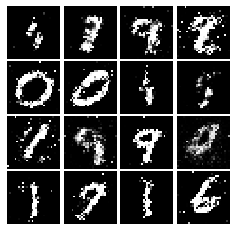

Epoch: 8, Iter: 3800, D: 1.387, G:0.7758


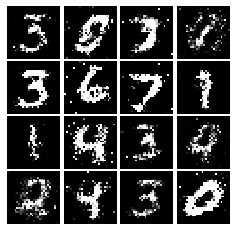

Epoch: 8, Iter: 3820, D: 1.275, G:0.9077


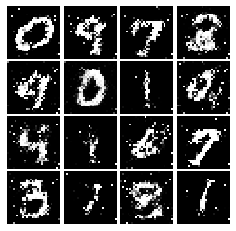

Epoch: 8, Iter: 3840, D: 1.383, G:0.8528


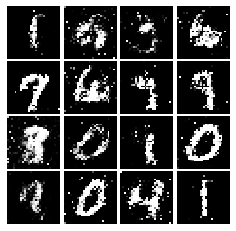

Epoch: 8, Iter: 3860, D: 1.261, G:0.9082


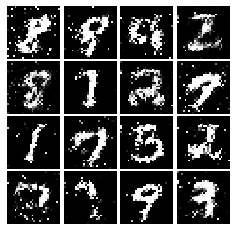

Epoch: 8, Iter: 3880, D: 1.352, G:0.7665


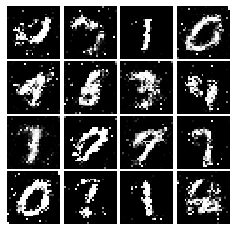

Epoch: 8, Iter: 3900, D: 1.365, G:0.8188


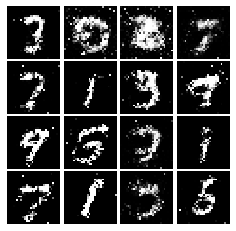

Epoch: 8, Iter: 3920, D: 1.254, G:0.8679


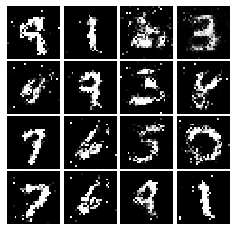

Epoch: 8, Iter: 3940, D: 1.341, G:0.7921


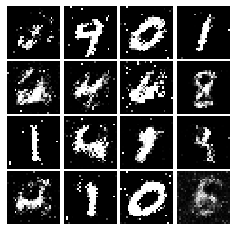

Epoch: 8, Iter: 3960, D: 1.239, G:0.7712


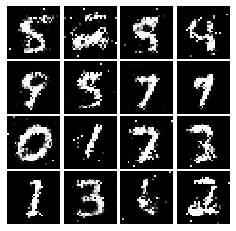

Epoch: 8, Iter: 3980, D: 1.308, G:0.7955


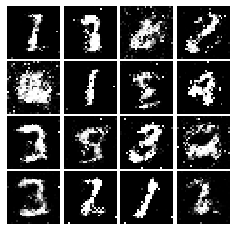

Epoch: 8, Iter: 4000, D: 1.293, G:0.7596


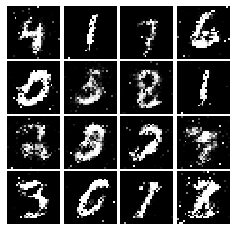

Epoch: 8, Iter: 4020, D: 1.265, G:0.7554


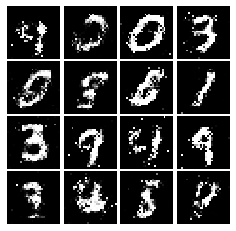

Epoch: 8, Iter: 4040, D: 1.461, G:0.8146


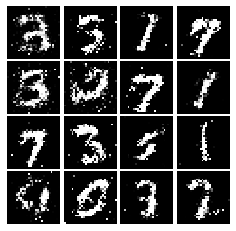

Epoch: 8, Iter: 4060, D: 1.303, G:0.9617


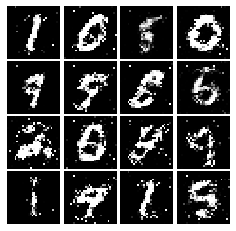

Epoch: 8, Iter: 4080, D: 1.423, G:0.9436


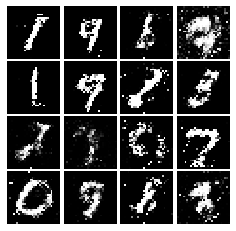

Epoch: 8, Iter: 4100, D: 1.293, G:0.732


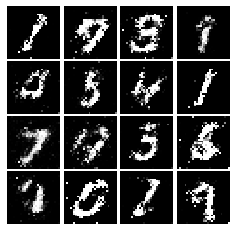

Epoch: 8, Iter: 4120, D: 1.274, G:0.7411


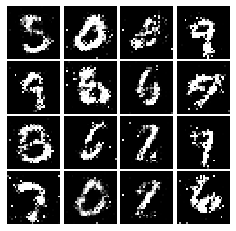

Epoch: 8, Iter: 4140, D: 1.35, G:0.8549


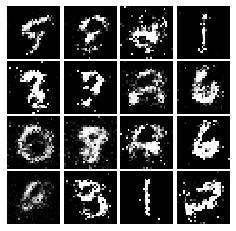

Epoch: 8, Iter: 4160, D: 1.342, G:0.8675


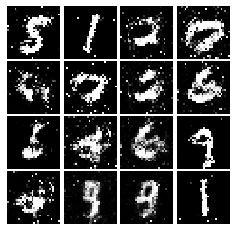

Epoch: 8, Iter: 4180, D: 1.286, G:0.7594


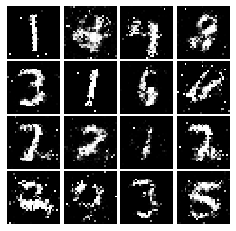

Epoch: 8, Iter: 4200, D: 1.321, G:0.779


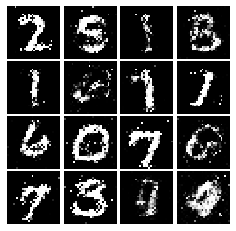

Epoch: 8, Iter: 4220, D: 1.279, G:0.8366


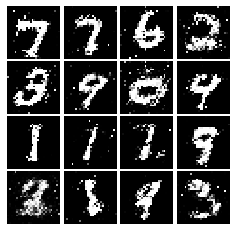

Epoch: 9, Iter: 4240, D: 1.364, G:0.7993


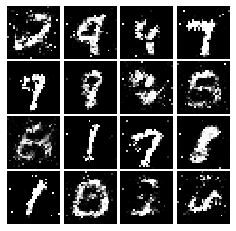

Epoch: 9, Iter: 4260, D: 1.238, G:0.8828


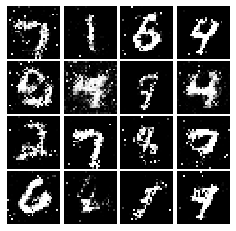

Epoch: 9, Iter: 4280, D: 1.343, G:0.8665


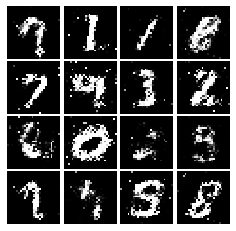

Epoch: 9, Iter: 4300, D: 1.373, G:0.8557


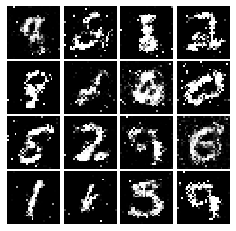

Epoch: 9, Iter: 4320, D: 1.275, G:0.8112


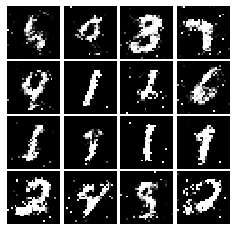

Epoch: 9, Iter: 4340, D: 1.37, G:0.9012


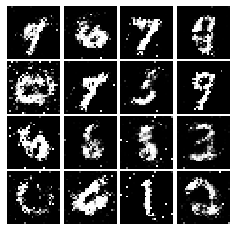

Epoch: 9, Iter: 4360, D: 1.329, G:0.7706


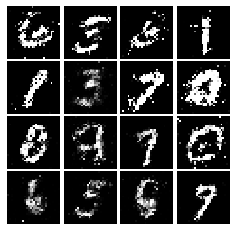

Epoch: 9, Iter: 4380, D: 1.43, G:0.8027


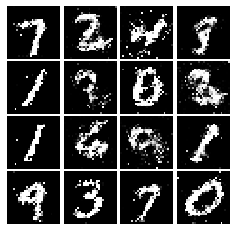

Epoch: 9, Iter: 4400, D: 1.199, G:0.8048


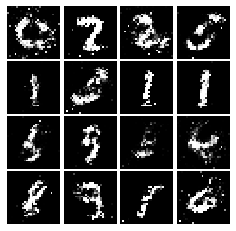

Epoch: 9, Iter: 4420, D: 1.251, G:0.8826


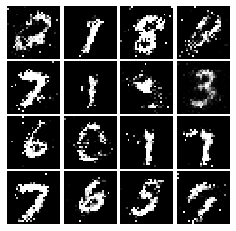

Epoch: 9, Iter: 4440, D: 1.316, G:0.8873


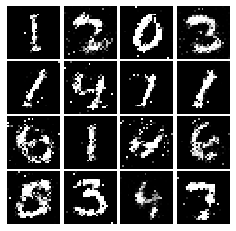

Epoch: 9, Iter: 4460, D: 1.241, G:0.8607


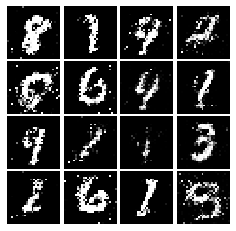

Epoch: 9, Iter: 4480, D: 1.283, G:0.7969


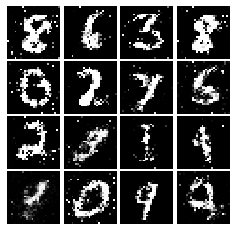

Epoch: 9, Iter: 4500, D: 1.423, G:0.8271


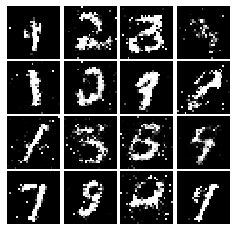

Epoch: 9, Iter: 4520, D: 1.37, G:0.7417


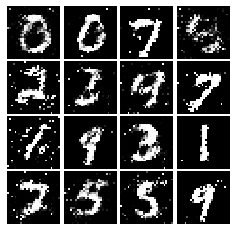

Epoch: 9, Iter: 4540, D: 1.286, G:0.809


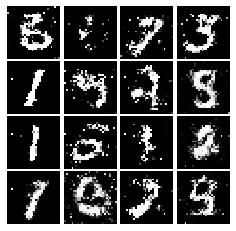

Epoch: 9, Iter: 4560, D: 1.285, G:0.7706


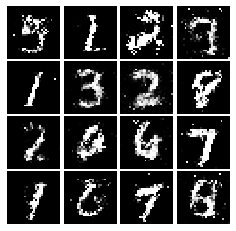

Epoch: 9, Iter: 4580, D: 1.404, G:0.8117


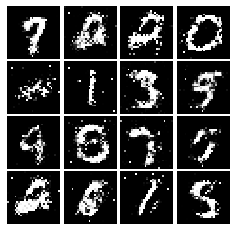

Epoch: 9, Iter: 4600, D: 1.407, G:0.8557


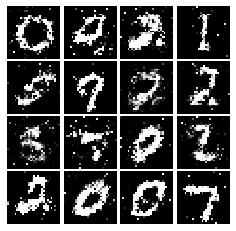

Epoch: 9, Iter: 4620, D: 1.285, G:0.8719


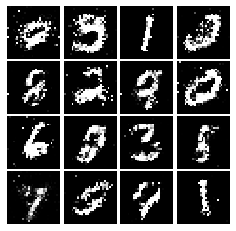

Epoch: 9, Iter: 4640, D: 1.302, G:0.8381


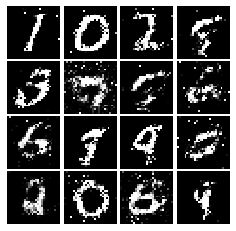

Epoch: 9, Iter: 4660, D: 1.378, G:0.9626


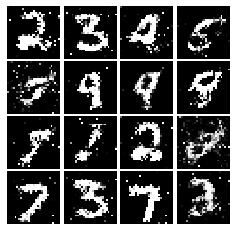

Epoch: 9, Iter: 4680, D: 1.258, G:0.815


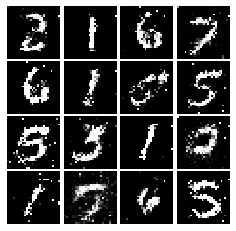

Final images


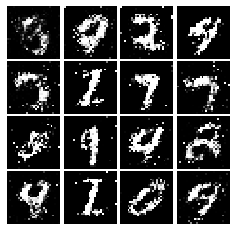

In [17]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN

In [18]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = 0.5*tf.reduce_mean(tf.square(scores_real - 1)) + 0.5*tf.reduce_mean(tf.square(scores_fake))
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    loss = 0.5*tf.reduce_mean((tf.square(scores_fake-1)))
    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [19]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.4301, G:0.3647


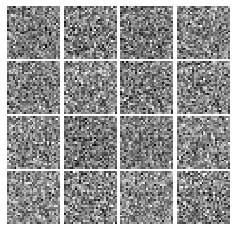

Epoch: 0, Iter: 20, D: 0.06618, G:1.335


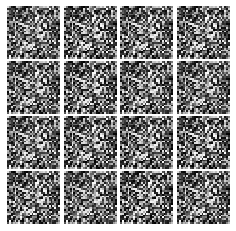

Epoch: 0, Iter: 40, D: 0.04532, G:0.9008


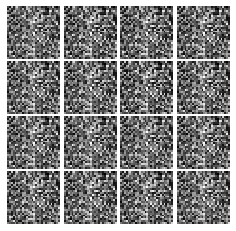

Epoch: 0, Iter: 60, D: 0.0345, G:0.7236


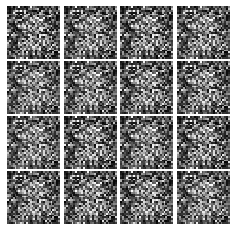

Epoch: 0, Iter: 80, D: 0.4151, G:0.2174


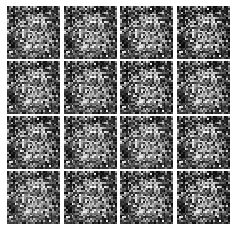

Epoch: 0, Iter: 100, D: 0.006603, G:0.4578


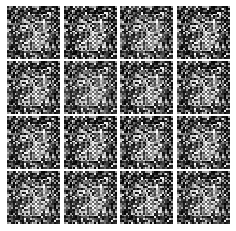

Epoch: 0, Iter: 120, D: 0.005119, G:0.5796


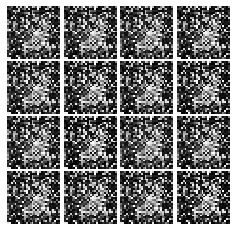

Epoch: 0, Iter: 140, D: 0.2653, G:0.7712


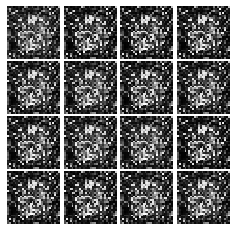

Epoch: 0, Iter: 160, D: 0.2008, G:1.219


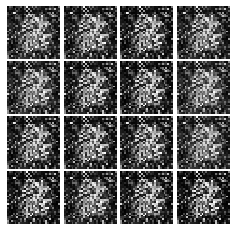

Epoch: 0, Iter: 180, D: 0.1522, G:0.4175


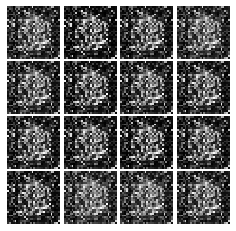

Epoch: 0, Iter: 200, D: 0.251, G:0.09265


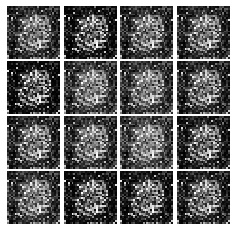

Epoch: 0, Iter: 220, D: 0.7259, G:0.8209


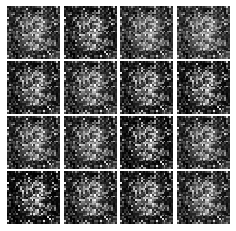

Epoch: 0, Iter: 240, D: 0.8468, G:0.8677


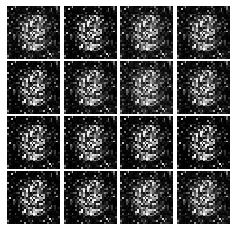

Epoch: 0, Iter: 260, D: 0.2725, G:0.07821


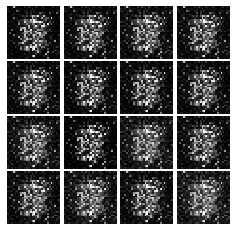

Epoch: 0, Iter: 280, D: 0.1019, G:0.4656


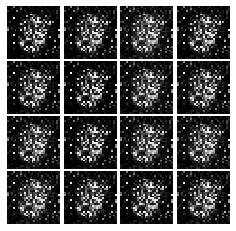

Epoch: 0, Iter: 300, D: 0.1995, G:0.5225


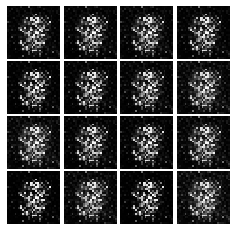

Epoch: 0, Iter: 320, D: 0.3478, G:0.04019


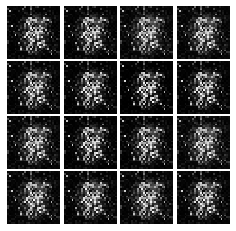

Epoch: 0, Iter: 340, D: 0.1002, G:0.4072


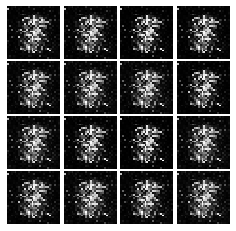

Epoch: 0, Iter: 360, D: 0.2391, G:0.2928


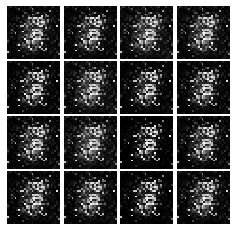

Epoch: 0, Iter: 380, D: 0.09518, G:0.4815


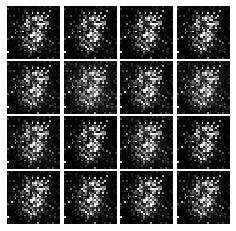

Epoch: 0, Iter: 400, D: 0.06613, G:0.5291


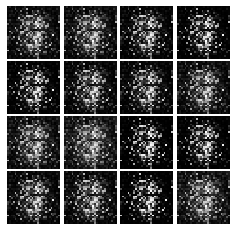

Epoch: 0, Iter: 420, D: 0.168, G:0.4826


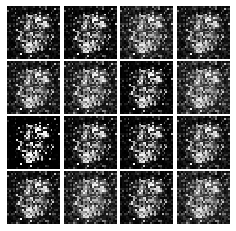

Epoch: 0, Iter: 440, D: 0.5114, G:0.2334


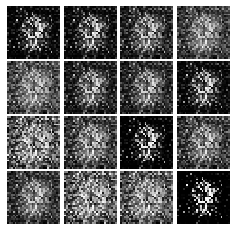

Epoch: 0, Iter: 460, D: 0.1659, G:0.2652


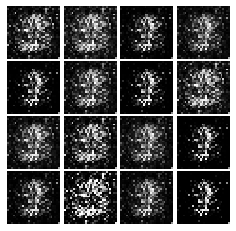

Epoch: 1, Iter: 480, D: 0.2463, G:0.3109


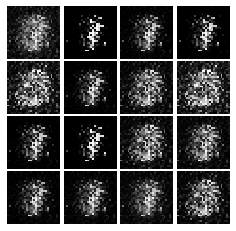

Epoch: 1, Iter: 500, D: 0.1717, G:0.3184


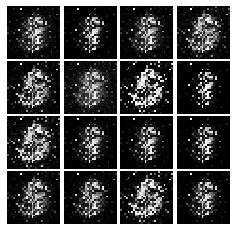

Epoch: 1, Iter: 520, D: 0.1692, G:0.3674


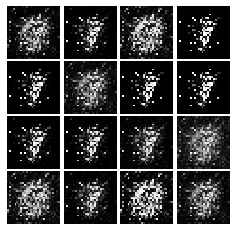

Epoch: 1, Iter: 540, D: 0.1519, G:0.4859


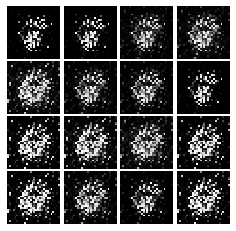

Epoch: 1, Iter: 560, D: 0.1817, G:0.5531


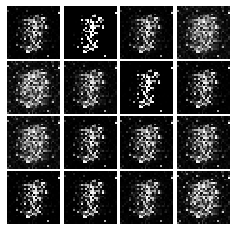

Epoch: 1, Iter: 580, D: 0.09994, G:0.4169


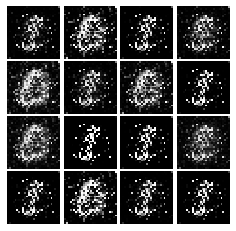

Epoch: 1, Iter: 600, D: 0.1138, G:0.5727


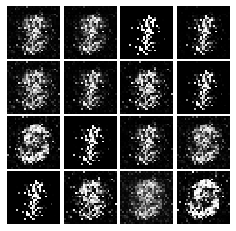

Epoch: 1, Iter: 620, D: 0.4275, G:0.02054


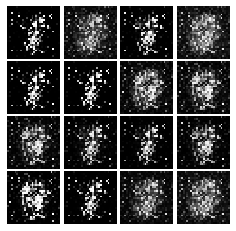

Epoch: 1, Iter: 640, D: 0.08347, G:0.4422


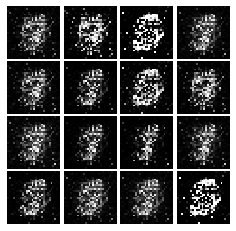

Epoch: 1, Iter: 660, D: 0.1681, G:0.3669


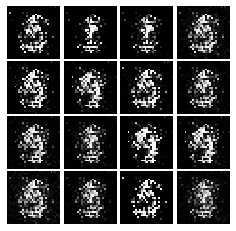

Epoch: 1, Iter: 680, D: 0.1958, G:0.4396


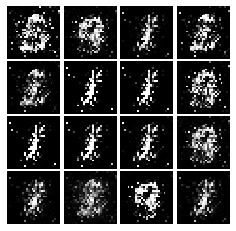

Epoch: 1, Iter: 700, D: 0.3483, G:0.3171


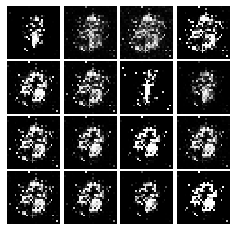

Epoch: 1, Iter: 720, D: 0.1875, G:0.2467


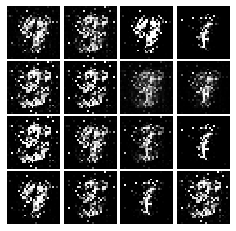

Epoch: 1, Iter: 740, D: 0.1413, G:0.4566


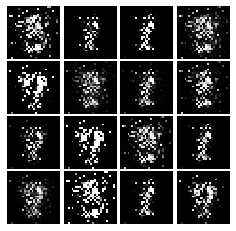

Epoch: 1, Iter: 760, D: 0.1062, G:0.3152


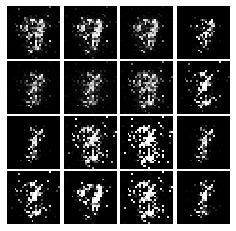

Epoch: 1, Iter: 780, D: 0.1634, G:0.3094


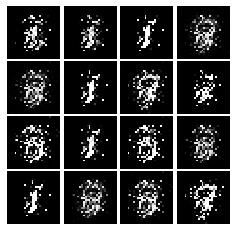

Epoch: 1, Iter: 800, D: 0.1469, G:0.4823


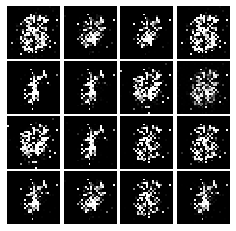

Epoch: 1, Iter: 820, D: 0.08218, G:0.6079


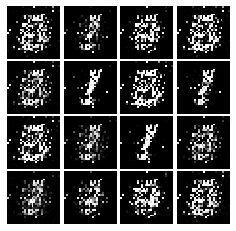

Epoch: 1, Iter: 840, D: 0.1184, G:0.379


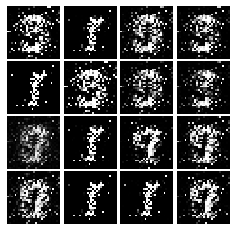

Epoch: 1, Iter: 860, D: 0.1174, G:0.7071


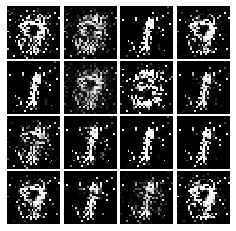

Epoch: 1, Iter: 880, D: 0.1114, G:0.5055


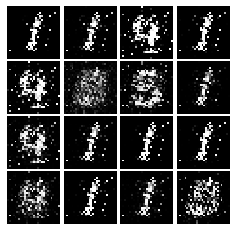

Epoch: 1, Iter: 900, D: 0.6889, G:0.184


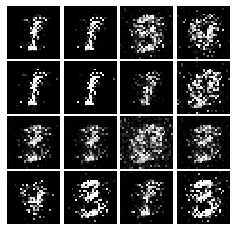

Epoch: 1, Iter: 920, D: 0.1665, G:0.2467


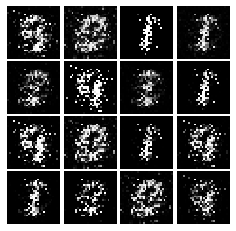

Epoch: 2, Iter: 940, D: 0.08735, G:0.7103


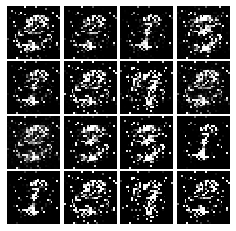

Epoch: 2, Iter: 960, D: 0.07841, G:0.4014


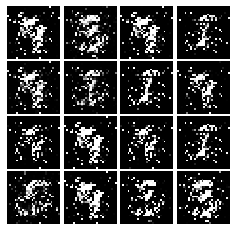

Epoch: 2, Iter: 980, D: 0.1551, G:0.3455


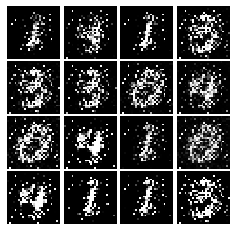

Epoch: 2, Iter: 1000, D: 0.09691, G:0.4295


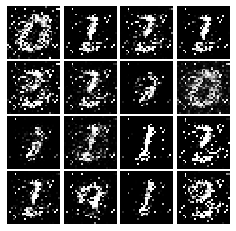

Epoch: 2, Iter: 1020, D: 0.1317, G:0.3528


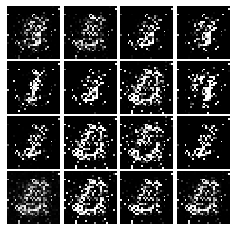

Epoch: 2, Iter: 1040, D: 0.1075, G:0.3484


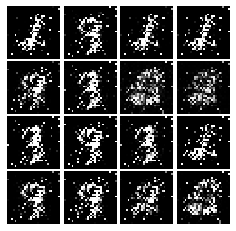

Epoch: 2, Iter: 1060, D: 0.685, G:0.4192


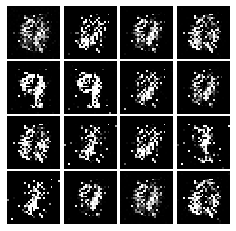

Epoch: 2, Iter: 1080, D: 0.1141, G:0.5222


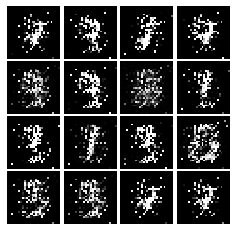

Epoch: 2, Iter: 1100, D: 0.1177, G:0.3693


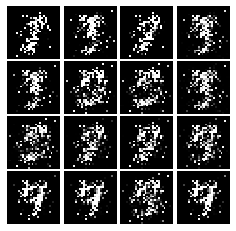

Epoch: 2, Iter: 1120, D: 0.1172, G:0.2776


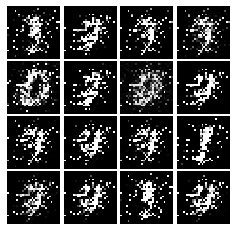

Epoch: 2, Iter: 1140, D: 0.1293, G:0.4239


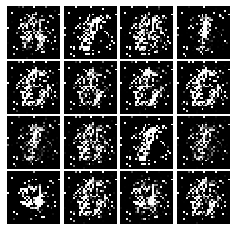

Epoch: 2, Iter: 1160, D: 0.2512, G:0.5978


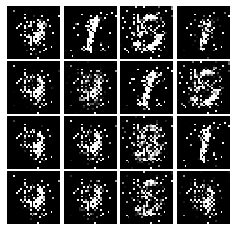

Epoch: 2, Iter: 1180, D: 0.08475, G:0.4861


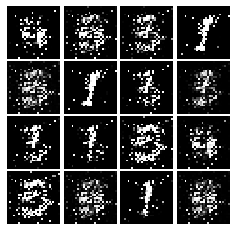

Epoch: 2, Iter: 1200, D: 0.1617, G:0.2487


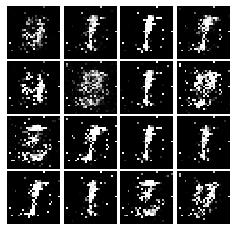

Epoch: 2, Iter: 1220, D: 0.1845, G:0.2809


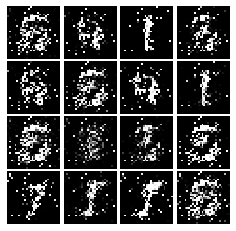

Epoch: 2, Iter: 1240, D: 0.1294, G:0.2919


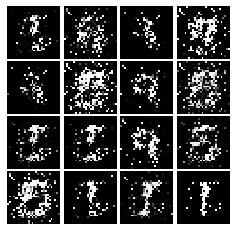

Epoch: 2, Iter: 1260, D: 0.4031, G:0.1591


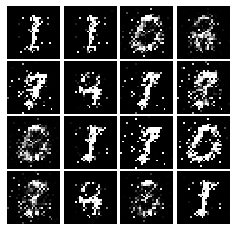

Epoch: 2, Iter: 1280, D: 0.1313, G:0.397


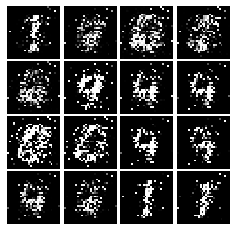

Epoch: 2, Iter: 1300, D: 0.1532, G:0.2516


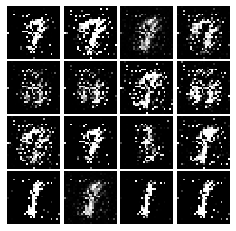

Epoch: 2, Iter: 1320, D: 0.1795, G:0.3048


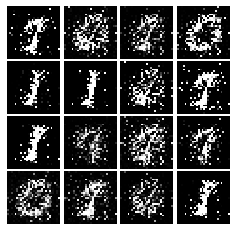

Epoch: 2, Iter: 1340, D: 0.3875, G:0.1248


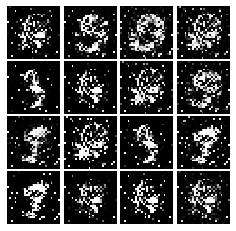

Epoch: 2, Iter: 1360, D: 0.227, G:0.2434


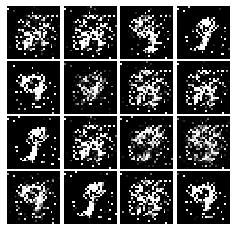

Epoch: 2, Iter: 1380, D: 0.2739, G:0.1213


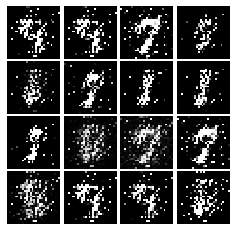

Epoch: 2, Iter: 1400, D: 0.1266, G:0.8061


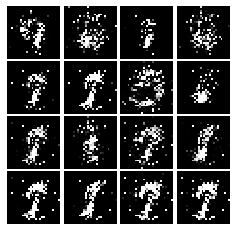

Epoch: 3, Iter: 1420, D: 0.1951, G:0.2977


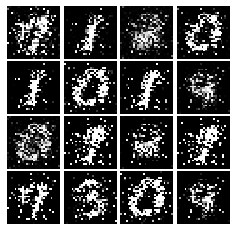

Epoch: 3, Iter: 1440, D: 0.1261, G:0.2633


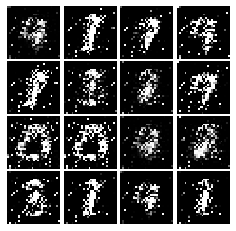

Epoch: 3, Iter: 1460, D: 0.1715, G:0.3208


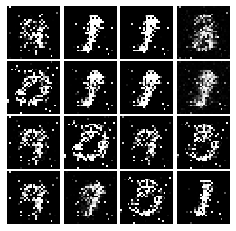

Epoch: 3, Iter: 1480, D: 0.1326, G:0.611


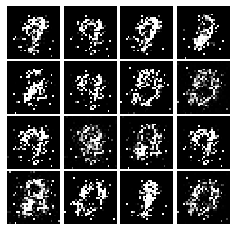

Epoch: 3, Iter: 1500, D: 0.1653, G:0.4191


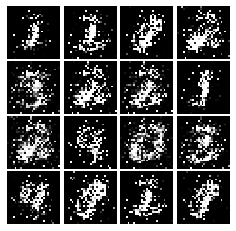

Epoch: 3, Iter: 1520, D: 0.1062, G:0.4041


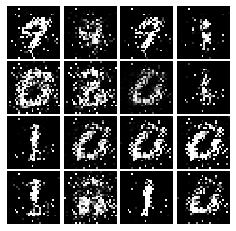

Epoch: 3, Iter: 1540, D: 0.1854, G:0.2571


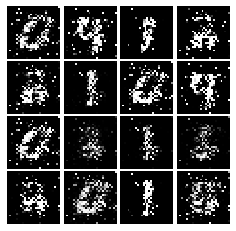

Epoch: 3, Iter: 1560, D: 0.1315, G:0.2846


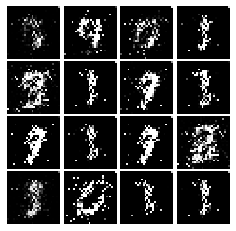

Epoch: 3, Iter: 1580, D: 0.3301, G:0.124


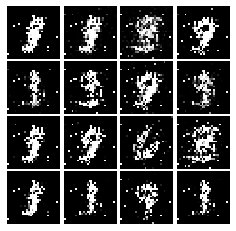

Epoch: 3, Iter: 1600, D: 0.1141, G:0.2981


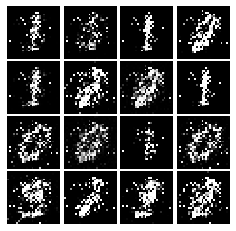

Epoch: 3, Iter: 1620, D: 0.1001, G:0.3224


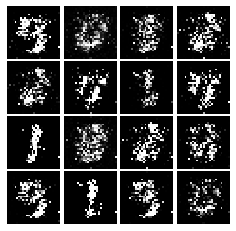

Epoch: 3, Iter: 1640, D: 0.167, G:0.3383


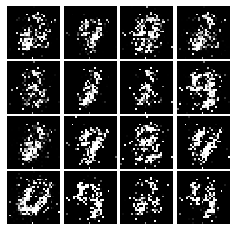

Epoch: 3, Iter: 1660, D: 0.1402, G:0.2999


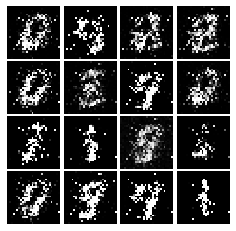

Epoch: 3, Iter: 1680, D: 0.144, G:0.3745


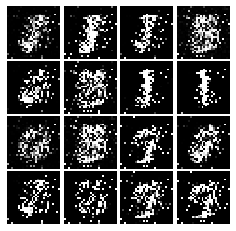

Epoch: 3, Iter: 1700, D: 0.1359, G:0.6283


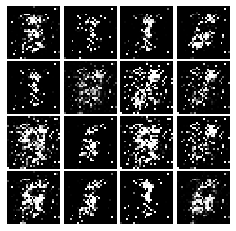

Epoch: 3, Iter: 1720, D: 0.1606, G:0.2451


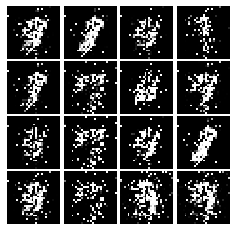

Epoch: 3, Iter: 1740, D: 0.1792, G:0.2938


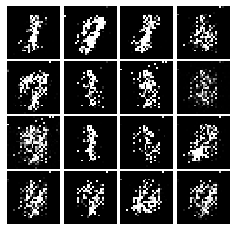

Epoch: 3, Iter: 1760, D: 0.1117, G:0.9066


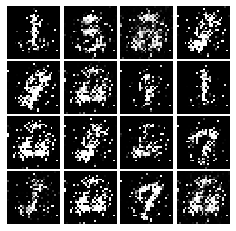

Epoch: 3, Iter: 1780, D: 0.1682, G:0.295


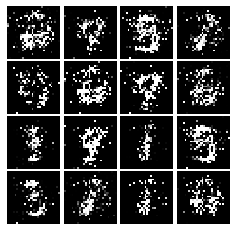

Epoch: 3, Iter: 1800, D: 0.1566, G:0.2836


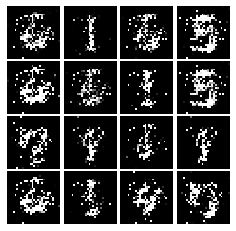

Epoch: 3, Iter: 1820, D: 0.1468, G:0.3382


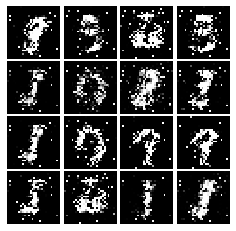

Epoch: 3, Iter: 1840, D: 0.1751, G:0.2467


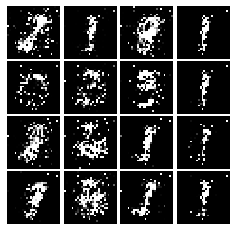

Epoch: 3, Iter: 1860, D: 0.1436, G:0.3357


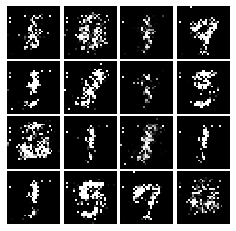

Epoch: 4, Iter: 1880, D: 0.1678, G:0.2954


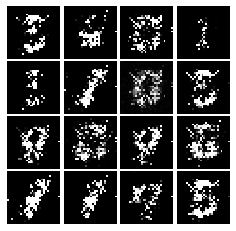

Epoch: 4, Iter: 1900, D: 0.1214, G:0.3935


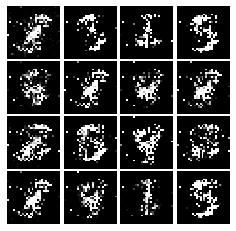

Epoch: 4, Iter: 1920, D: 0.2321, G:0.5273


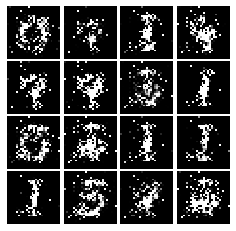

Epoch: 4, Iter: 1940, D: 0.1622, G:0.2763


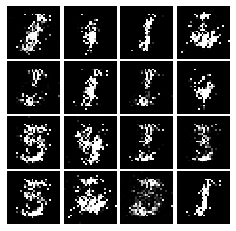

Epoch: 4, Iter: 1960, D: 0.1584, G:0.2786


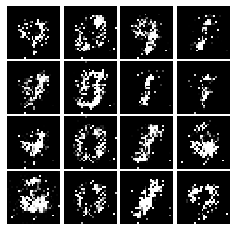

Epoch: 4, Iter: 1980, D: 0.1681, G:0.2393


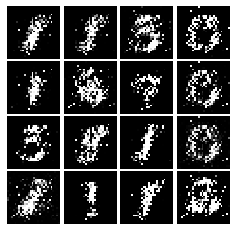

Epoch: 4, Iter: 2000, D: 0.148, G:0.7905


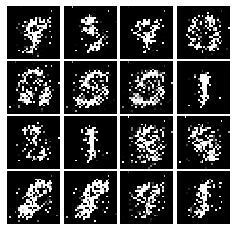

Epoch: 4, Iter: 2020, D: 0.2038, G:0.3153


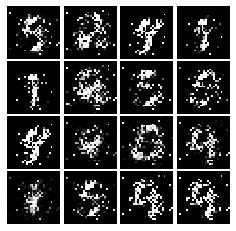

Epoch: 4, Iter: 2040, D: 0.1821, G:0.2694


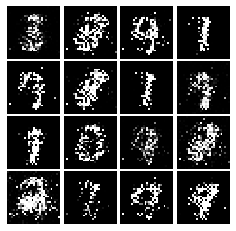

Epoch: 4, Iter: 2060, D: 0.1558, G:0.225


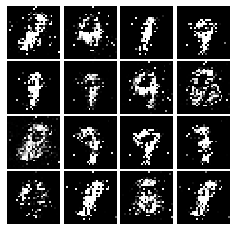

Epoch: 4, Iter: 2080, D: 0.194, G:0.2171


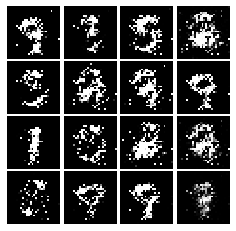

Epoch: 4, Iter: 2100, D: 0.1644, G:0.2219


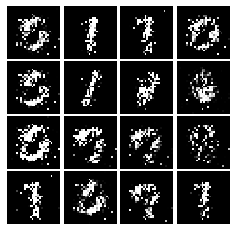

Epoch: 4, Iter: 2120, D: 0.1295, G:0.3167


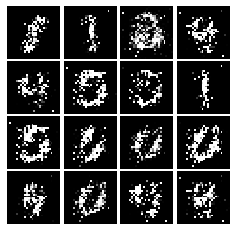

Epoch: 4, Iter: 2140, D: 0.173, G:0.2351


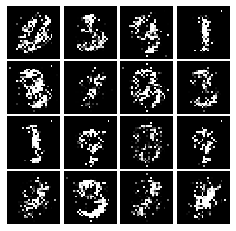

Epoch: 4, Iter: 2160, D: 0.2714, G:0.2287


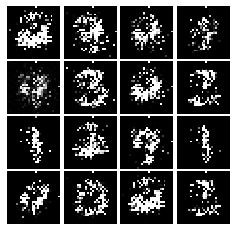

Epoch: 4, Iter: 2180, D: 0.386, G:0.1768


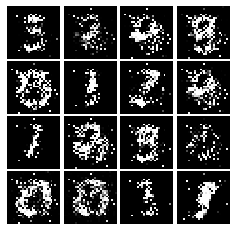

Epoch: 4, Iter: 2200, D: 0.2225, G:0.232


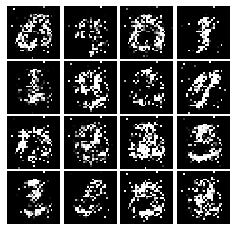

Epoch: 4, Iter: 2220, D: 0.2148, G:0.2193


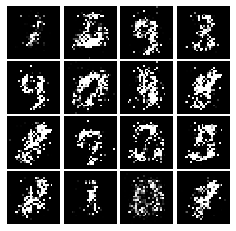

Epoch: 4, Iter: 2240, D: 0.2176, G:0.1886


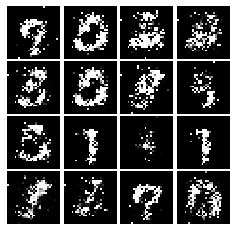

Epoch: 4, Iter: 2260, D: 0.1991, G:0.2333


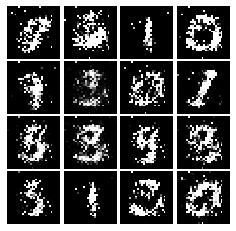

Epoch: 4, Iter: 2280, D: 0.1933, G:0.253


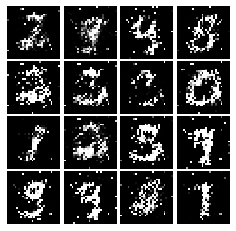

Epoch: 4, Iter: 2300, D: 0.1805, G:0.2137


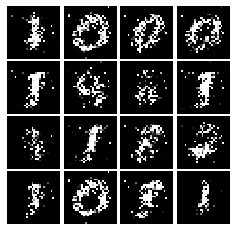

Epoch: 4, Iter: 2320, D: 0.1793, G:0.2485


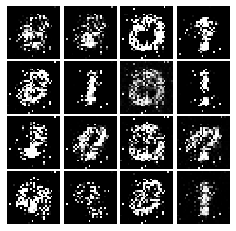

Epoch: 4, Iter: 2340, D: 0.1778, G:0.3363


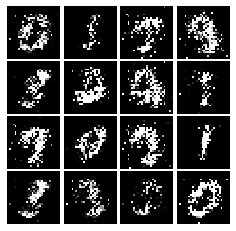

Epoch: 5, Iter: 2360, D: 0.148, G:0.1685


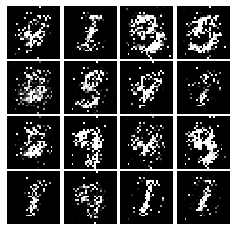

Epoch: 5, Iter: 2380, D: 0.1907, G:0.239


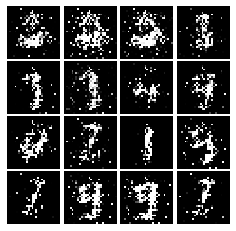

Epoch: 5, Iter: 2400, D: 0.1695, G:0.3008


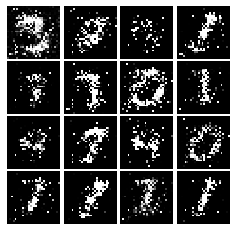

Epoch: 5, Iter: 2420, D: 0.1764, G:0.2709


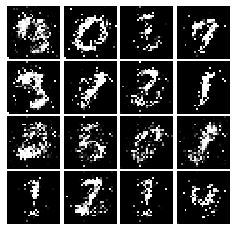

Epoch: 5, Iter: 2440, D: 0.1577, G:0.2616


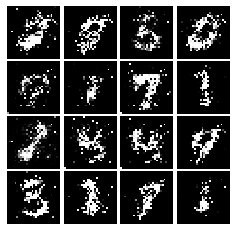

Epoch: 5, Iter: 2460, D: 0.1599, G:0.2643


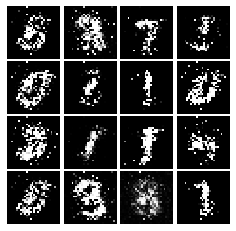

Epoch: 5, Iter: 2480, D: 0.2236, G:0.2284


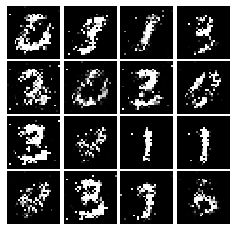

Epoch: 5, Iter: 2500, D: 0.1619, G:0.2858


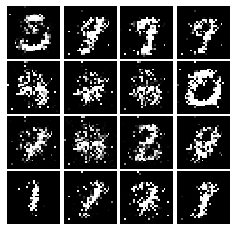

Epoch: 5, Iter: 2520, D: 0.2149, G:0.1615


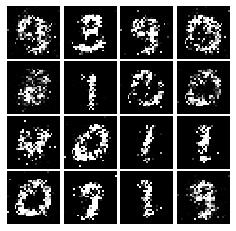

Epoch: 5, Iter: 2540, D: 0.2071, G:0.2128


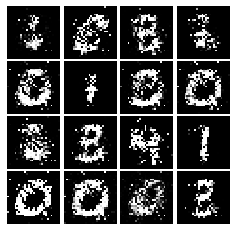

Epoch: 5, Iter: 2560, D: 0.2047, G:0.2536


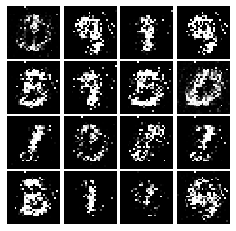

Epoch: 5, Iter: 2580, D: 0.1778, G:0.3124


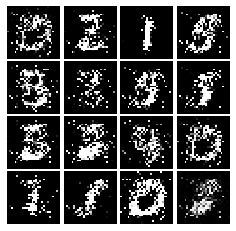

Epoch: 5, Iter: 2600, D: 0.1989, G:0.2422


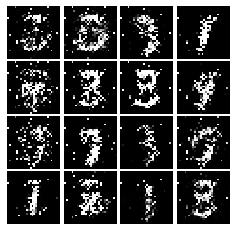

Epoch: 5, Iter: 2620, D: 0.1979, G:0.2072


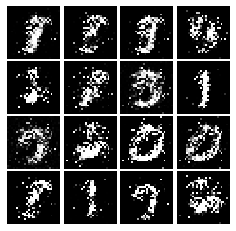

Epoch: 5, Iter: 2640, D: 0.1664, G:0.2367


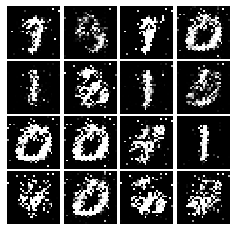

Epoch: 5, Iter: 2660, D: 0.2007, G:0.2127


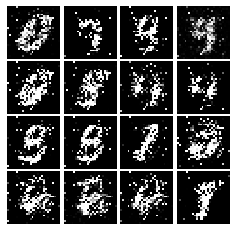

Epoch: 5, Iter: 2680, D: 0.2321, G:0.1877


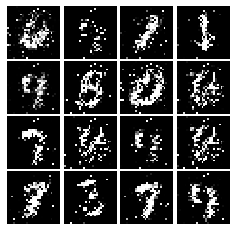

Epoch: 5, Iter: 2700, D: 0.2038, G:0.1737


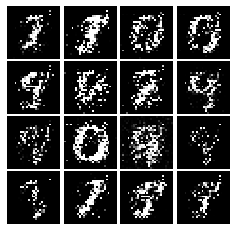

Epoch: 5, Iter: 2720, D: 0.1721, G:0.2695


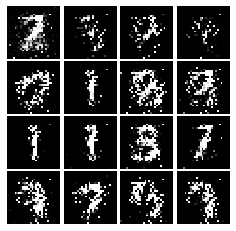

Epoch: 5, Iter: 2740, D: 0.2017, G:0.2682


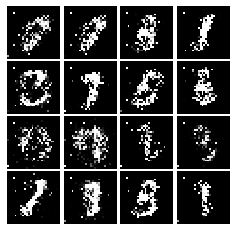

Epoch: 5, Iter: 2760, D: 0.2134, G:0.1882


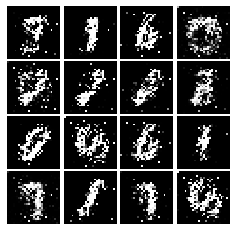

Epoch: 5, Iter: 2780, D: 0.2188, G:0.2123


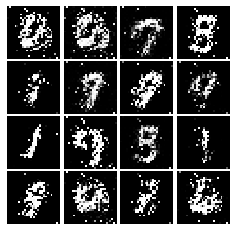

Epoch: 5, Iter: 2800, D: 0.2144, G:0.3696


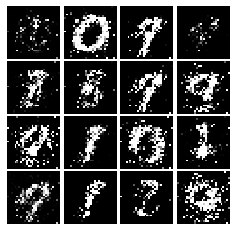

Epoch: 6, Iter: 2820, D: 0.2128, G:0.2003


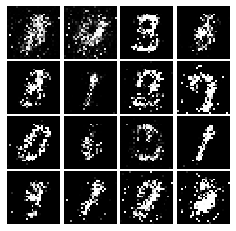

Epoch: 6, Iter: 2840, D: 0.2218, G:0.2363


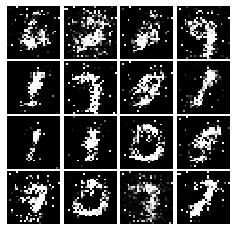

Epoch: 6, Iter: 2860, D: 0.186, G:0.2131


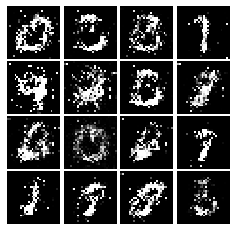

Epoch: 6, Iter: 2880, D: 0.2007, G:0.1836


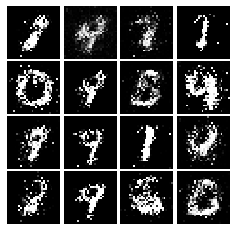

Epoch: 6, Iter: 2900, D: 0.2281, G:0.1751


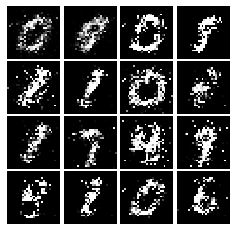

Epoch: 6, Iter: 2920, D: 0.221, G:0.1777


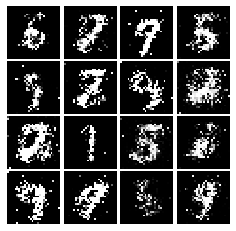

Epoch: 6, Iter: 2940, D: 0.236, G:0.1681


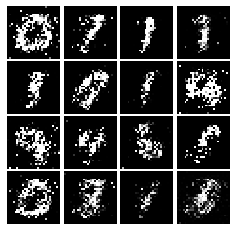

Epoch: 6, Iter: 2960, D: 0.2286, G:0.1999


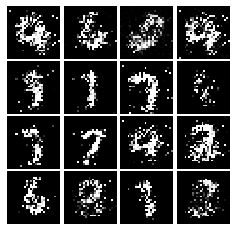

Epoch: 6, Iter: 2980, D: 0.2447, G:0.1808


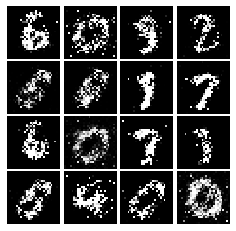

Epoch: 6, Iter: 3000, D: 0.2023, G:0.2032


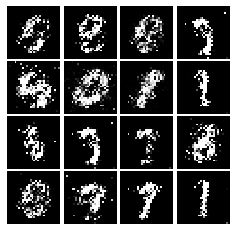

Epoch: 6, Iter: 3020, D: 0.2017, G:0.1585


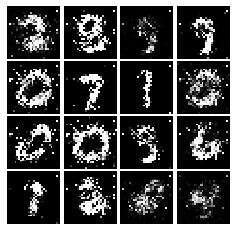

Epoch: 6, Iter: 3040, D: 0.2182, G:0.2182


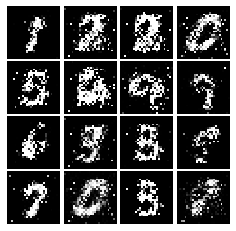

Epoch: 6, Iter: 3060, D: 0.2186, G:0.1664


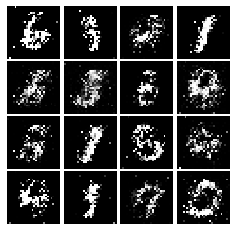

Epoch: 6, Iter: 3080, D: 0.2092, G:0.1591


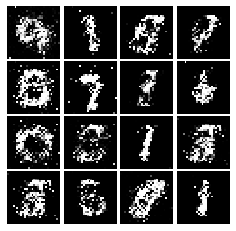

Epoch: 6, Iter: 3100, D: 0.1979, G:0.2052


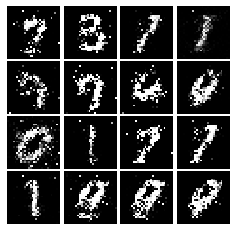

Epoch: 6, Iter: 3120, D: 0.2144, G:0.2057


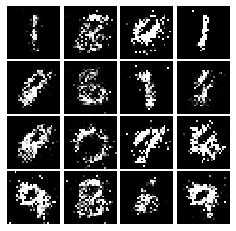

Epoch: 6, Iter: 3140, D: 0.2072, G:0.1859


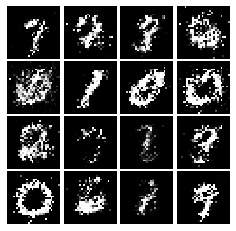

Epoch: 6, Iter: 3160, D: 0.2311, G:0.1955


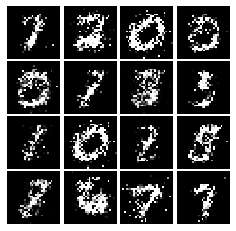

Epoch: 6, Iter: 3180, D: 0.2179, G:0.2236


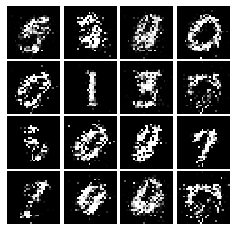

Epoch: 6, Iter: 3200, D: 0.2248, G:0.182


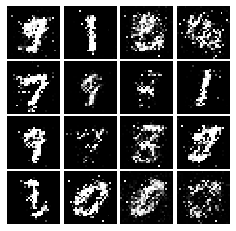

Epoch: 6, Iter: 3220, D: 0.2127, G:0.1885


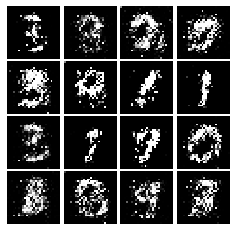

Epoch: 6, Iter: 3240, D: 0.2243, G:0.1695


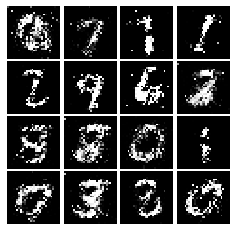

Epoch: 6, Iter: 3260, D: 0.2442, G:0.1714


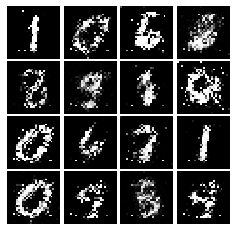

Epoch: 6, Iter: 3280, D: 0.2252, G:0.1962


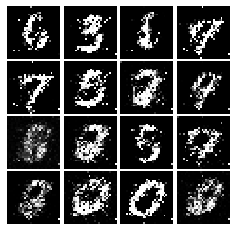

Epoch: 7, Iter: 3300, D: 0.1889, G:0.1833


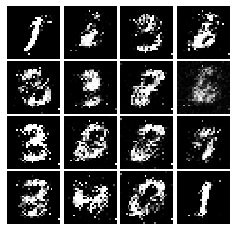

Epoch: 7, Iter: 3320, D: 0.2294, G:0.1336


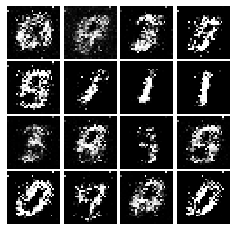

Epoch: 7, Iter: 3340, D: 0.2246, G:0.1887


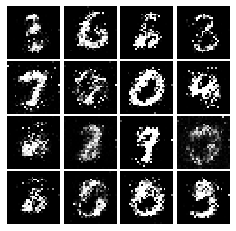

Epoch: 7, Iter: 3360, D: 0.4184, G:0.5443


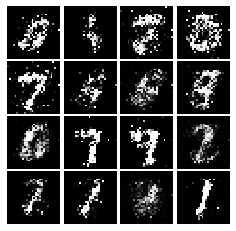

Epoch: 7, Iter: 3380, D: 0.2879, G:0.2094


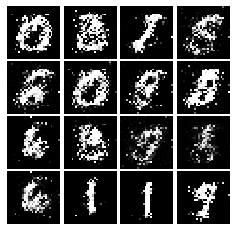

Epoch: 7, Iter: 3400, D: 0.2387, G:0.1826


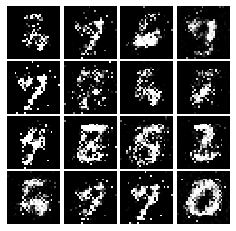

Epoch: 7, Iter: 3420, D: 0.2347, G:0.1665


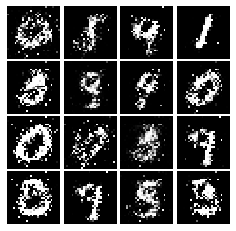

Epoch: 7, Iter: 3440, D: 0.2344, G:0.2053


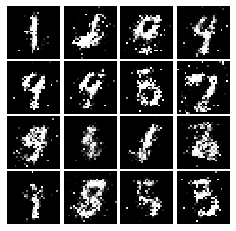

Epoch: 7, Iter: 3460, D: 0.2453, G:0.1856


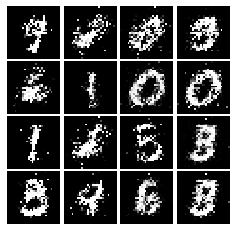

Epoch: 7, Iter: 3480, D: 0.2306, G:0.1854


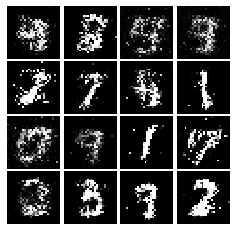

Epoch: 7, Iter: 3500, D: 0.2556, G:0.1652


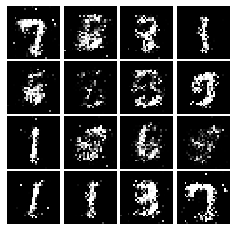

Epoch: 7, Iter: 3520, D: 0.2062, G:0.175


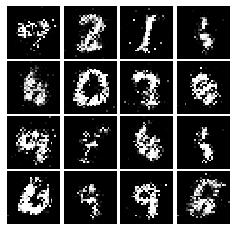

Epoch: 7, Iter: 3540, D: 0.2016, G:0.186


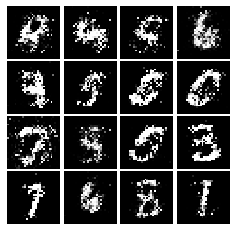

Epoch: 7, Iter: 3560, D: 0.24, G:0.1639


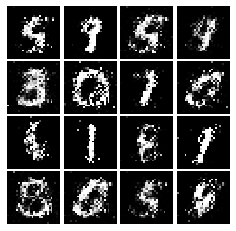

Epoch: 7, Iter: 3580, D: 0.2351, G:0.1632


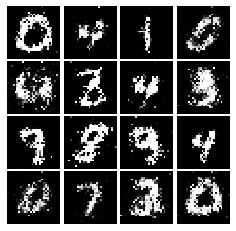

Epoch: 7, Iter: 3600, D: 0.2461, G:0.1634


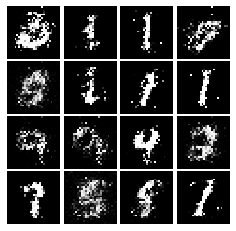

Epoch: 7, Iter: 3620, D: 0.2342, G:0.1613


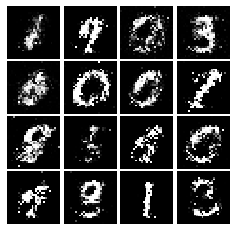

Epoch: 7, Iter: 3640, D: 0.2606, G:0.1993


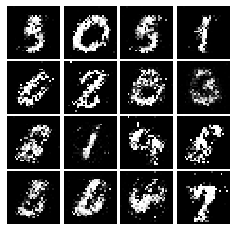

Epoch: 7, Iter: 3660, D: 0.2244, G:0.1696


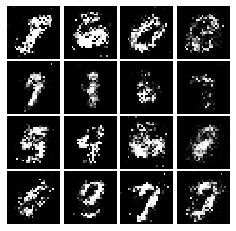

Epoch: 7, Iter: 3680, D: 0.2357, G:0.1523


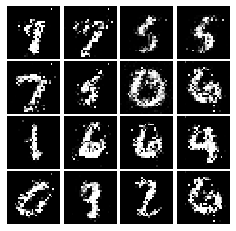

Epoch: 7, Iter: 3700, D: 0.2418, G:0.1626


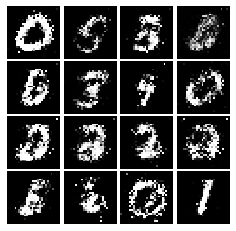

Epoch: 7, Iter: 3720, D: 0.219, G:0.1798


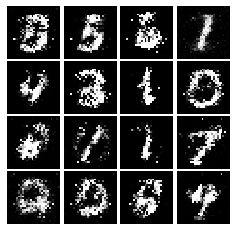

Epoch: 7, Iter: 3740, D: 0.2387, G:0.1594


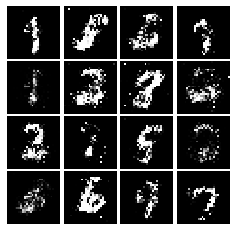

Epoch: 8, Iter: 3760, D: 0.2416, G:0.155


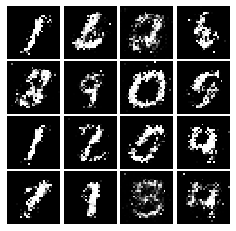

Epoch: 8, Iter: 3780, D: 0.2403, G:0.1547


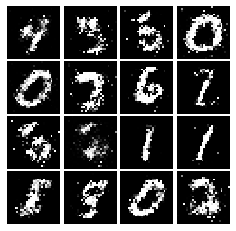

Epoch: 8, Iter: 3800, D: 0.2353, G:0.1617


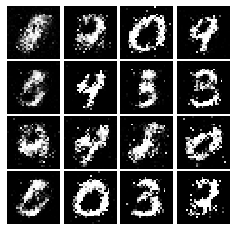

Epoch: 8, Iter: 3820, D: 0.2504, G:0.1743


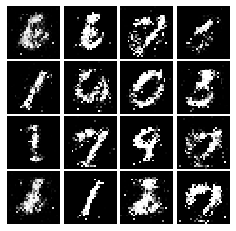

Epoch: 8, Iter: 3840, D: 0.2231, G:0.151


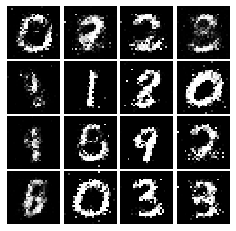

Epoch: 8, Iter: 3860, D: 0.2187, G:0.1745


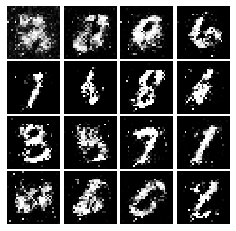

Epoch: 8, Iter: 3880, D: 0.2405, G:0.1435


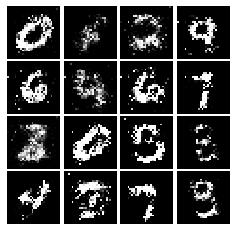

Epoch: 8, Iter: 3900, D: 0.2529, G:0.1486


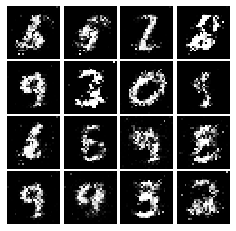

Epoch: 8, Iter: 3920, D: 0.2268, G:0.1746


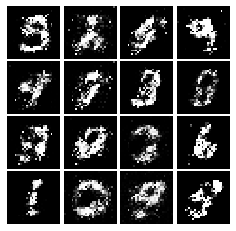

Epoch: 8, Iter: 3940, D: 0.2145, G:0.1693


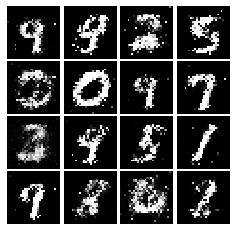

Epoch: 8, Iter: 3960, D: 0.247, G:0.1594


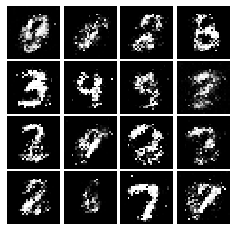

Epoch: 8, Iter: 3980, D: 0.2338, G:0.1797


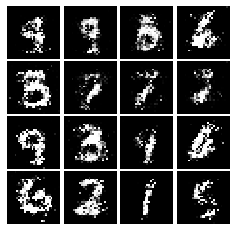

Epoch: 8, Iter: 4000, D: 0.2396, G:0.1638


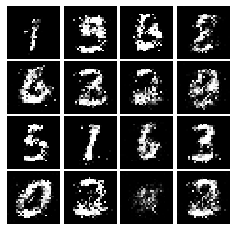

Epoch: 8, Iter: 4020, D: 0.2262, G:0.1486


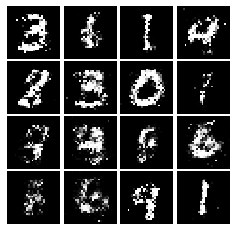

Epoch: 8, Iter: 4040, D: 0.2551, G:0.1624


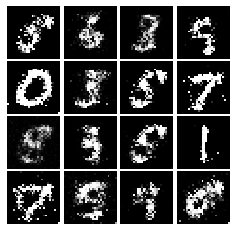

Epoch: 8, Iter: 4060, D: 0.217, G:0.1628


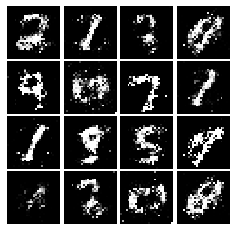

Epoch: 8, Iter: 4080, D: 0.2252, G:0.1367


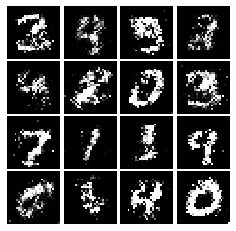

Epoch: 8, Iter: 4100, D: 0.2212, G:0.1677


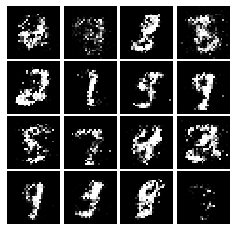

Epoch: 8, Iter: 4120, D: 0.2346, G:0.1647


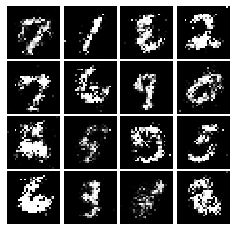

Epoch: 8, Iter: 4140, D: 0.2281, G:0.1747


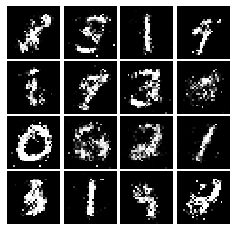

Epoch: 8, Iter: 4160, D: 0.2276, G:0.1781


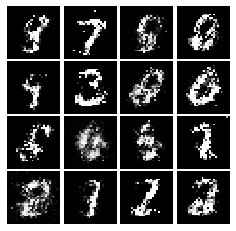

Epoch: 8, Iter: 4180, D: 0.2942, G:0.1782


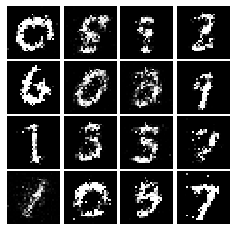

Epoch: 8, Iter: 4200, D: 0.2231, G:0.1914


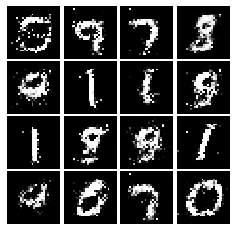

Epoch: 8, Iter: 4220, D: 0.2202, G:0.1802


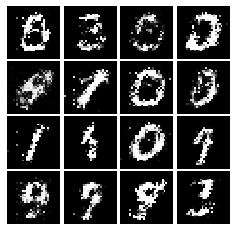

Epoch: 9, Iter: 4240, D: 0.2521, G:0.1617


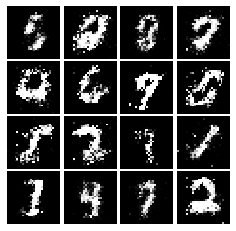

Epoch: 9, Iter: 4260, D: 0.2458, G:0.193


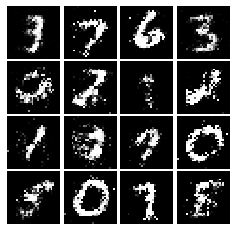

Epoch: 9, Iter: 4280, D: 0.2526, G:0.1501


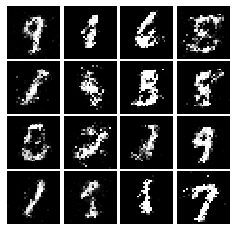

Epoch: 9, Iter: 4300, D: 0.2143, G:0.1404


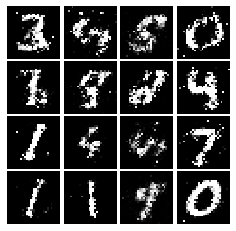

Epoch: 9, Iter: 4320, D: 0.2238, G:0.1628


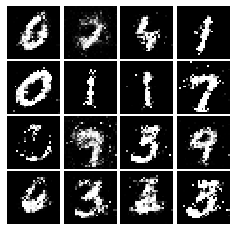

Epoch: 9, Iter: 4340, D: 0.2467, G:0.1837


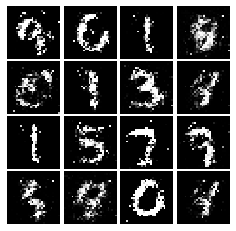

Epoch: 9, Iter: 4360, D: 0.2546, G:0.1554


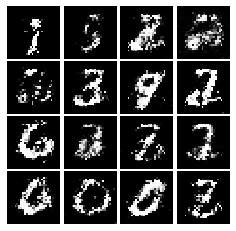

Epoch: 9, Iter: 4380, D: 0.2599, G:0.1507


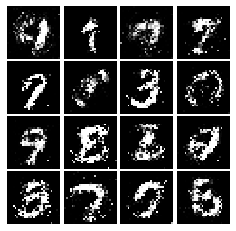

Epoch: 9, Iter: 4400, D: 0.2833, G:0.06494


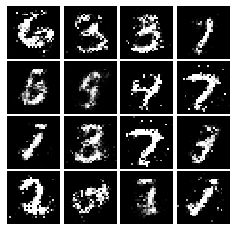

Epoch: 9, Iter: 4420, D: 0.2174, G:0.1606


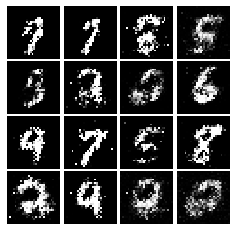

Epoch: 9, Iter: 4440, D: 0.2194, G:0.1489


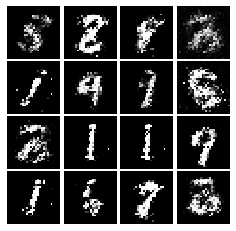

Epoch: 9, Iter: 4460, D: 0.2436, G:0.1666


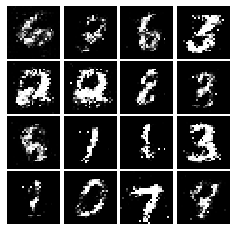

Epoch: 9, Iter: 4480, D: 0.2336, G:0.1786


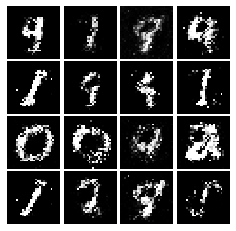

Epoch: 9, Iter: 4500, D: 0.2703, G:0.1301


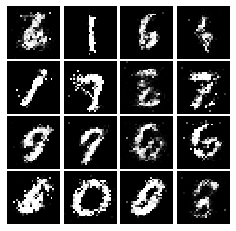

Epoch: 9, Iter: 4520, D: 0.2533, G:0.1531


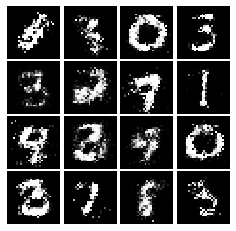

Epoch: 9, Iter: 4540, D: 0.2514, G:0.1398


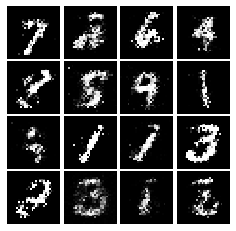

Epoch: 9, Iter: 4560, D: 0.2279, G:0.1536


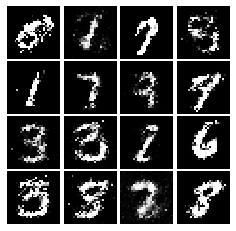

Epoch: 9, Iter: 4580, D: 0.2586, G:0.1665


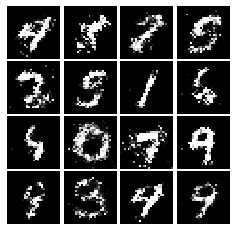

Epoch: 9, Iter: 4600, D: 0.2521, G:0.1614


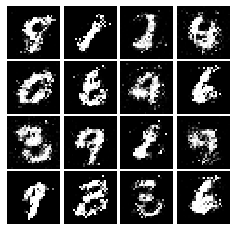

Epoch: 9, Iter: 4620, D: 0.2535, G:0.1798


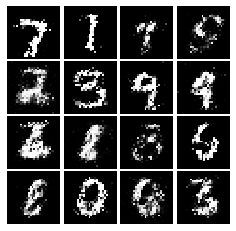

Epoch: 9, Iter: 4640, D: 0.2378, G:0.1784


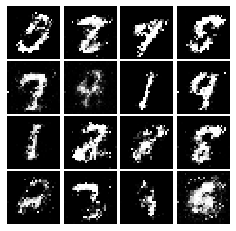

Epoch: 9, Iter: 4660, D: 0.261, G:0.1518


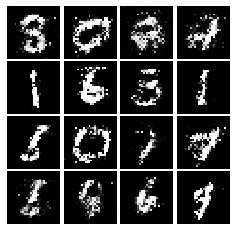

Epoch: 9, Iter: 4680, D: 0.2375, G:0.1549


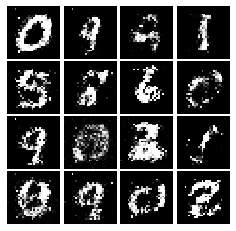

Final images


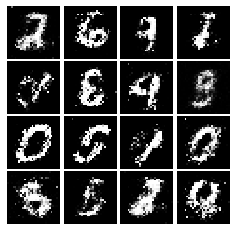

In [20]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs

In [21]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Reshape((28,28,1)),
        tf.keras.layers.Conv2D(32,(5,5),strides = 1,padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides = 2),
        tf.keras.layers.Conv2D(64,(5,5),strides = 1,padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides = 2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator

In [22]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    tf.keras.layers.InputLayer(noise_dim),
    tf.keras.layers.Dense(1024,activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(7*7*128,activation = 'relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Reshape((7,7,128)),
    tf.keras.layers.Conv2DTranspose(filters=64,kernel_size=(4,4),strides = 2,activation = tf.nn.relu,padding = 'SAME'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(filters=1,kernel_size=(4,4),strides = 2,activation = tf.tanh,padding = 'SAME')
    ])
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


### Train and evaluate a DCGAN

Epoch: 0, Iter: 0, D: 1.386, G:0.6601


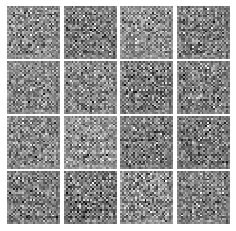

Epoch: 0, Iter: 20, D: 0.1014, G:2.771


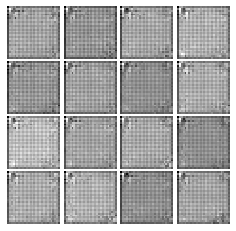

Epoch: 0, Iter: 40, D: 0.002835, G:5.969


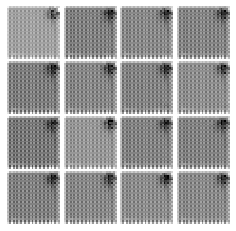

Epoch: 0, Iter: 60, D: 0.2926, G:6.682e-07


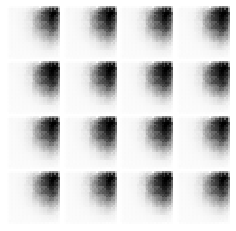

Epoch: 0, Iter: 80, D: 0.01265, G:4.741


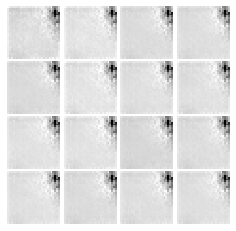

Epoch: 0, Iter: 100, D: 0.002324, G:6.442


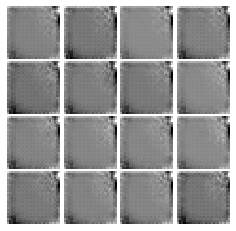

Epoch: 0, Iter: 120, D: 0.0009741, G:7.164


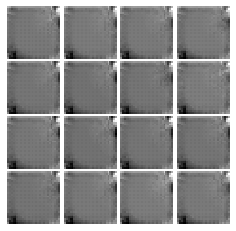

Epoch: 0, Iter: 140, D: 0.0004561, G:11.95


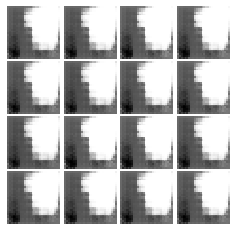

Epoch: 0, Iter: 160, D: 0.5295, G:3.114


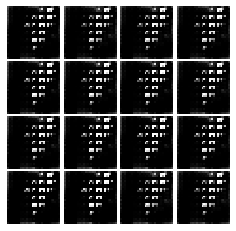

Epoch: 0, Iter: 180, D: 0.329, G:3.376


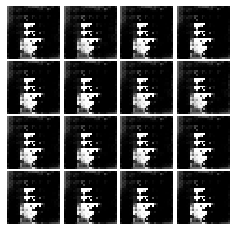

Epoch: 0, Iter: 200, D: 0.07085, G:4.614


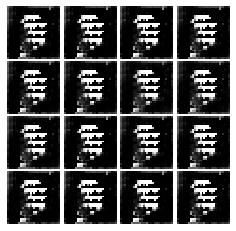

Epoch: 0, Iter: 220, D: 0.02646, G:4.826


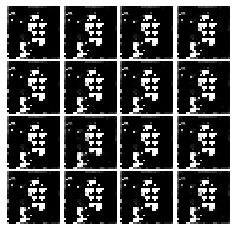

Epoch: 0, Iter: 240, D: 0.09676, G:2.103


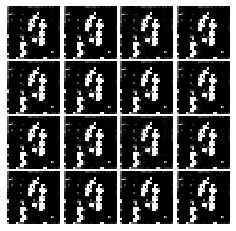

Epoch: 0, Iter: 260, D: 0.1854, G:3.333


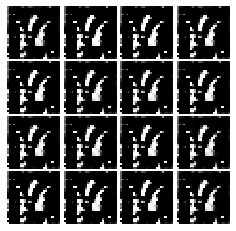

Epoch: 0, Iter: 280, D: 0.4097, G:1.96


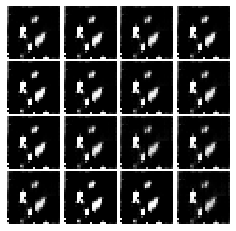

Epoch: 0, Iter: 300, D: 0.4069, G:5.317


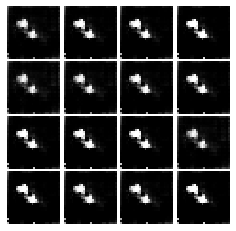

Epoch: 0, Iter: 320, D: 1.113, G:1.128


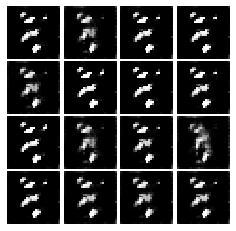

Epoch: 0, Iter: 340, D: 1.276, G:1.215


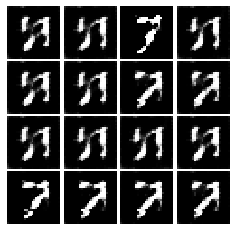

Epoch: 0, Iter: 360, D: 1.353, G:1.393


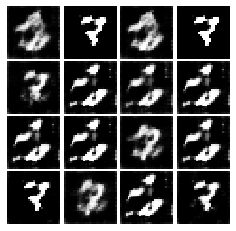

Epoch: 0, Iter: 380, D: 0.846, G:1.477


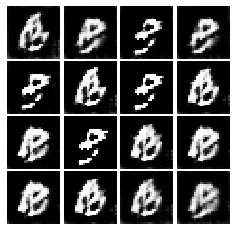

Epoch: 0, Iter: 400, D: 1.004, G:1.321


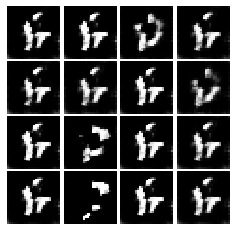

Epoch: 0, Iter: 420, D: 1.39, G:1.076


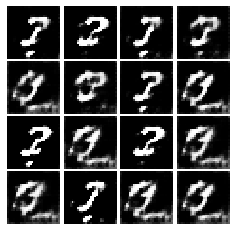

Epoch: 0, Iter: 440, D: 0.9834, G:1.402


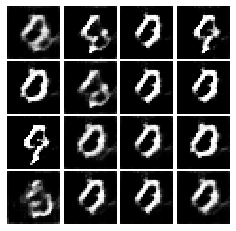

Epoch: 0, Iter: 460, D: 0.8888, G:1.132


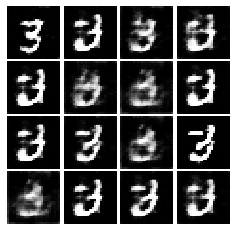

Epoch: 1, Iter: 480, D: 1.216, G:1.128


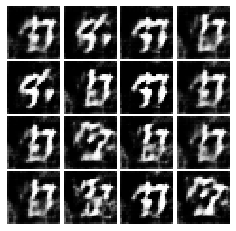

Epoch: 1, Iter: 500, D: 1.337, G:0.6206


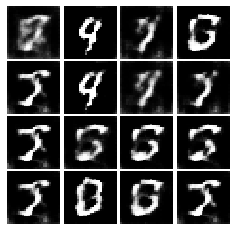

Epoch: 1, Iter: 520, D: 1.326, G:0.9155


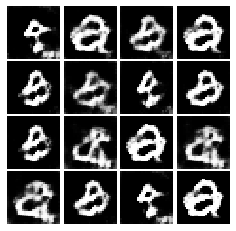

Epoch: 1, Iter: 540, D: 0.4627, G:2.827


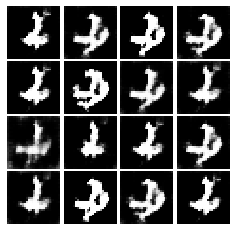

Epoch: 1, Iter: 560, D: 1.728, G:1.027


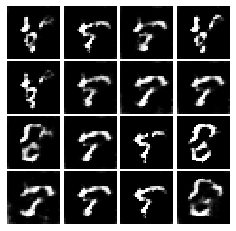

Epoch: 1, Iter: 580, D: 0.9139, G:0.9431


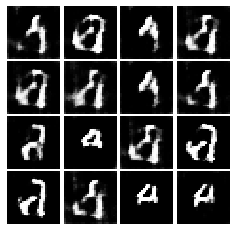

Epoch: 1, Iter: 600, D: 1.363, G:0.8127


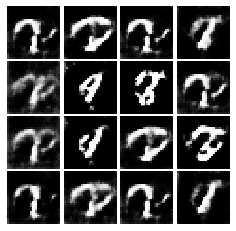

Epoch: 1, Iter: 620, D: 1.837, G:1.821


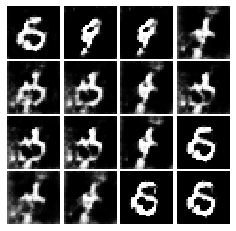

Epoch: 1, Iter: 640, D: 0.9221, G:2.171


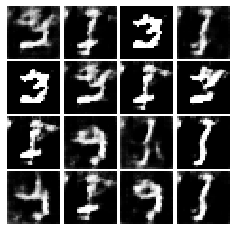

Epoch: 1, Iter: 660, D: 1.243, G:3.588


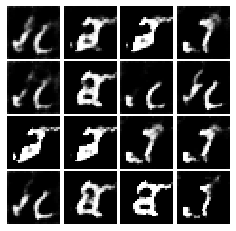

Epoch: 1, Iter: 680, D: 0.5806, G:2.442


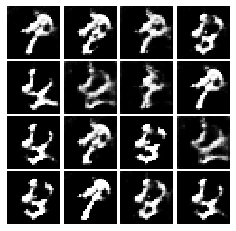

Epoch: 1, Iter: 700, D: 0.8399, G:1.802


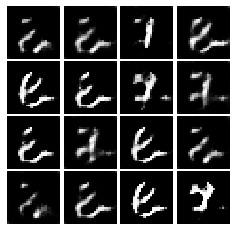

Epoch: 1, Iter: 720, D: 0.4885, G:2.618


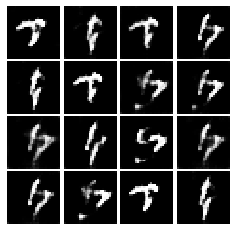

Epoch: 1, Iter: 740, D: 1.081, G:1.378


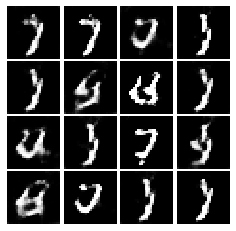

Epoch: 1, Iter: 760, D: 1.003, G:3.339


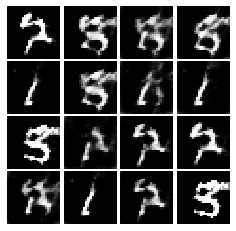

Epoch: 1, Iter: 780, D: 0.6654, G:1.85


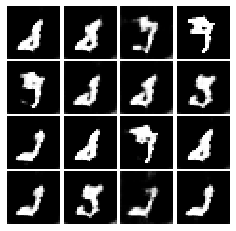

Epoch: 1, Iter: 800, D: 2.519, G:6.44


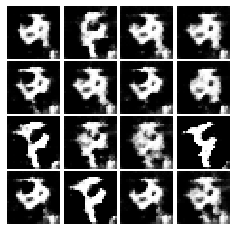

Epoch: 1, Iter: 820, D: 1.568, G:2.525


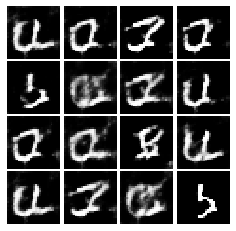

Epoch: 1, Iter: 840, D: 0.7474, G:2.829


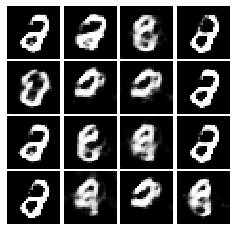

Epoch: 1, Iter: 860, D: 0.6942, G:2.18


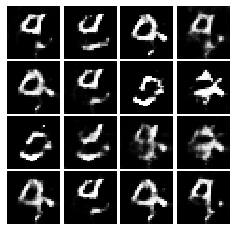

Epoch: 1, Iter: 880, D: 0.6841, G:2.231


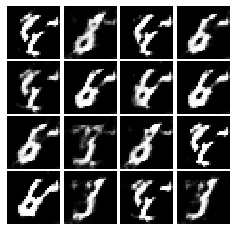

Epoch: 1, Iter: 900, D: 0.219, G:4.069


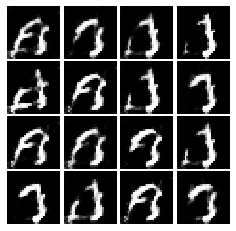

Epoch: 1, Iter: 920, D: 0.3691, G:2.919


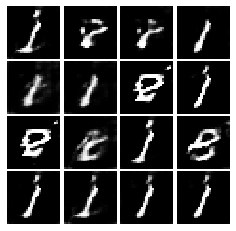

Epoch: 2, Iter: 940, D: 0.9153, G:1.895


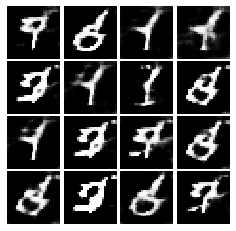

Epoch: 2, Iter: 960, D: 0.686, G:2.599


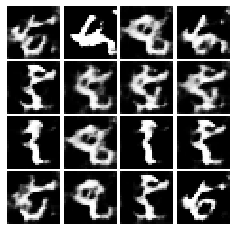

Epoch: 2, Iter: 980, D: 0.5445, G:2.266


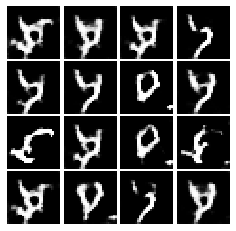

Epoch: 2, Iter: 1000, D: 0.9227, G:2.414


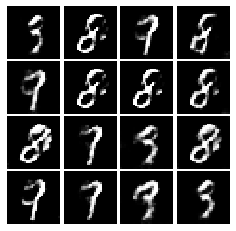

Epoch: 2, Iter: 1020, D: 0.5402, G:2.369


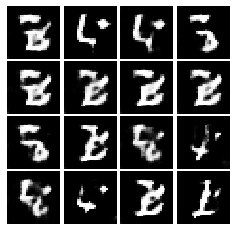

Epoch: 2, Iter: 1040, D: 0.6278, G:2.838


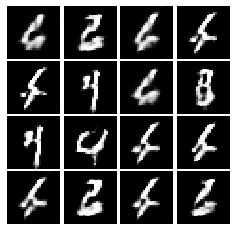

Epoch: 2, Iter: 1060, D: 0.6086, G:2.045


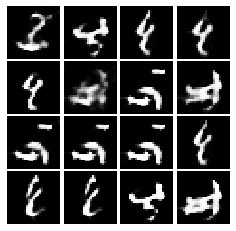

Epoch: 2, Iter: 1080, D: 0.401, G:2.82


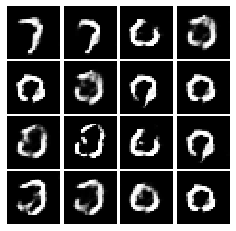

Epoch: 2, Iter: 1100, D: 0.724, G:2.921


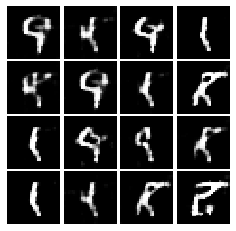

Epoch: 2, Iter: 1120, D: 0.8644, G:2.5


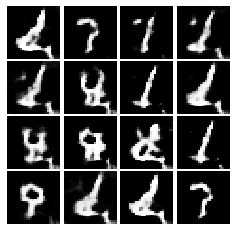

Epoch: 2, Iter: 1140, D: 0.7016, G:2.124


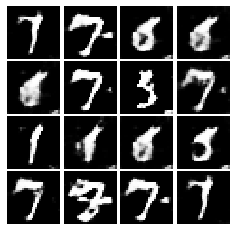

Epoch: 2, Iter: 1160, D: 0.5774, G:1.759


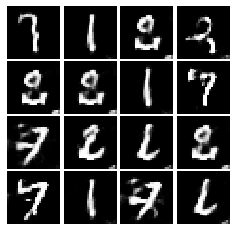

Epoch: 2, Iter: 1180, D: 0.497, G:2.31


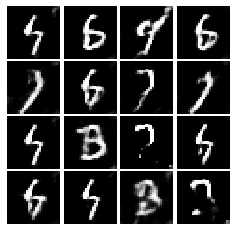

Epoch: 2, Iter: 1200, D: 0.5859, G:2.897


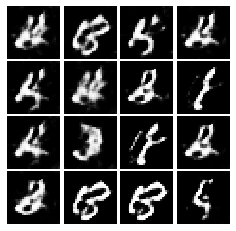

Epoch: 2, Iter: 1220, D: 0.8268, G:2.062


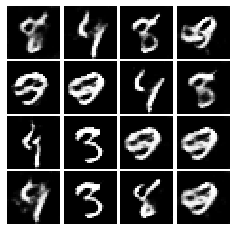

Epoch: 2, Iter: 1240, D: 0.4978, G:2.869


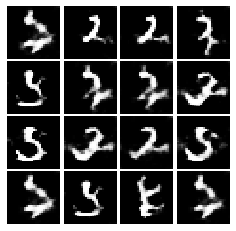

Epoch: 2, Iter: 1260, D: 0.5171, G:1.946


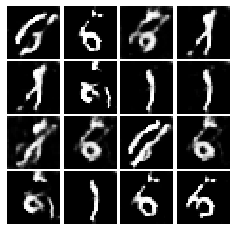

Epoch: 2, Iter: 1280, D: 0.678, G:2.603


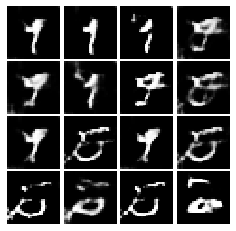

Epoch: 2, Iter: 1300, D: 0.5924, G:2.149


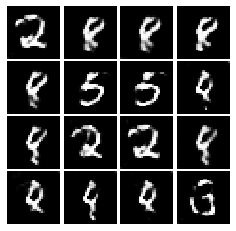

Epoch: 2, Iter: 1320, D: 0.6087, G:2.55


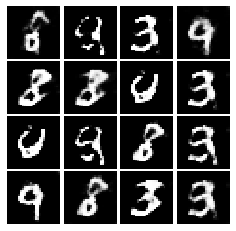

Epoch: 2, Iter: 1340, D: 1.424, G:3.383


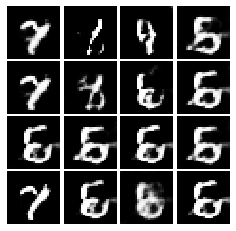

Epoch: 2, Iter: 1360, D: 0.5165, G:2.604


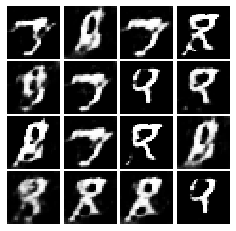

Epoch: 2, Iter: 1380, D: 0.33, G:3.011


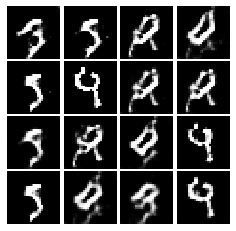

Epoch: 2, Iter: 1400, D: 0.3394, G:2.992


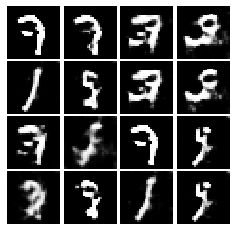

Epoch: 3, Iter: 1420, D: 0.3271, G:2.988


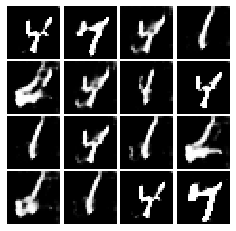

Epoch: 3, Iter: 1440, D: 0.4532, G:3.024


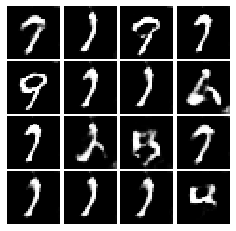

Epoch: 3, Iter: 1460, D: 0.7429, G:4.029


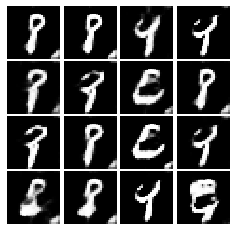

Epoch: 3, Iter: 1480, D: 0.3484, G:3.511


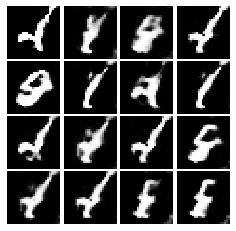

Epoch: 3, Iter: 1500, D: 0.6229, G:1.987


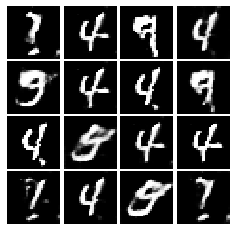

Epoch: 3, Iter: 1520, D: 0.5431, G:3.068


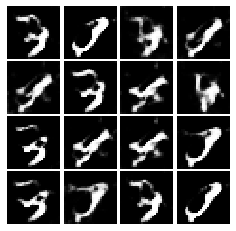

Epoch: 3, Iter: 1540, D: 0.7371, G:2.214


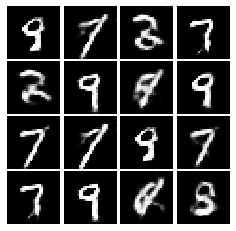

Epoch: 3, Iter: 1560, D: 0.8706, G:1.641


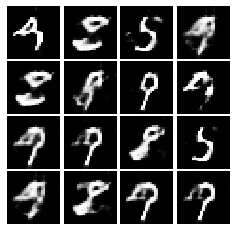

Epoch: 3, Iter: 1580, D: 0.3261, G:2.271


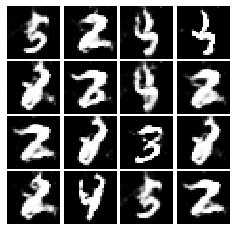

Epoch: 3, Iter: 1600, D: 0.6108, G:1.396


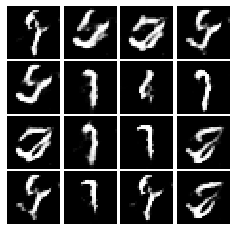

Epoch: 3, Iter: 1620, D: 0.5476, G:2.757


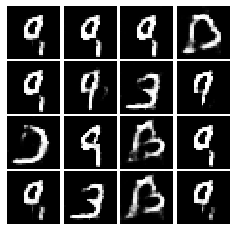

Epoch: 3, Iter: 1640, D: 0.7798, G:2.339


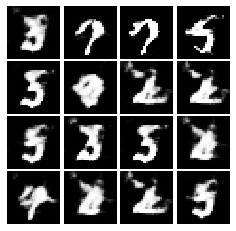

Epoch: 3, Iter: 1660, D: 1.49, G:7.093


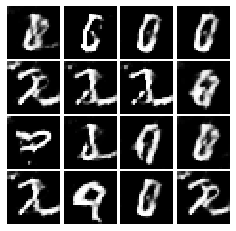

Epoch: 3, Iter: 1680, D: 0.4917, G:2.552


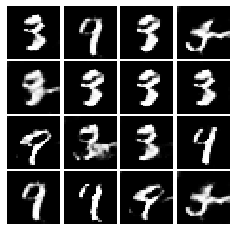

Epoch: 3, Iter: 1700, D: 0.6437, G:2.185


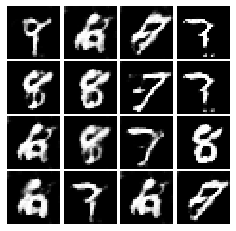

Epoch: 3, Iter: 1720, D: 0.49, G:2.567


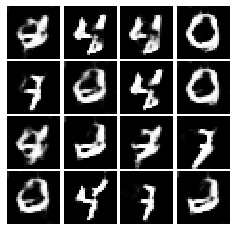

Epoch: 3, Iter: 1740, D: 0.4752, G:2.472


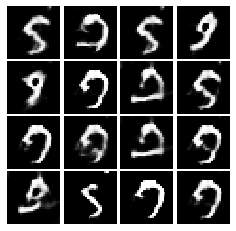

Epoch: 3, Iter: 1760, D: 0.3277, G:3.761


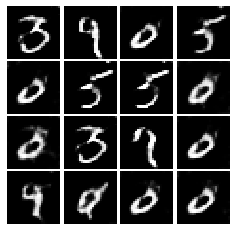

Epoch: 3, Iter: 1780, D: 0.4154, G:2.499


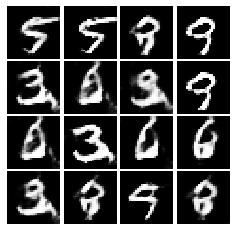

Epoch: 3, Iter: 1800, D: 0.3872, G:3.858


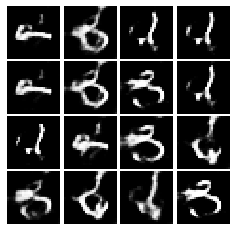

Epoch: 3, Iter: 1820, D: 0.4975, G:2.364


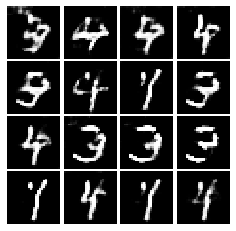

Epoch: 3, Iter: 1840, D: 0.8382, G:1.708


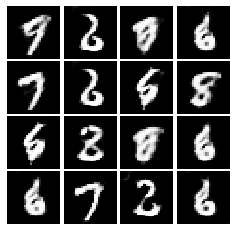

Epoch: 3, Iter: 1860, D: 0.474, G:2.393


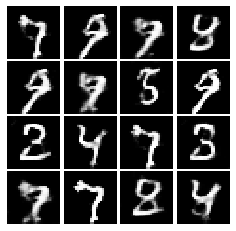

Epoch: 4, Iter: 1880, D: 0.4455, G:2.808


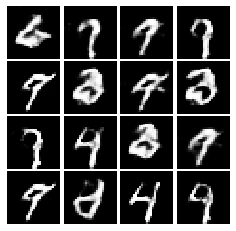

Epoch: 4, Iter: 1900, D: 0.3844, G:3.184


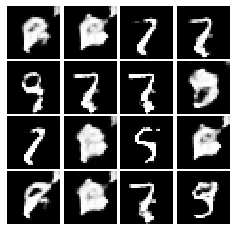

Epoch: 4, Iter: 1920, D: 0.5682, G:1.564


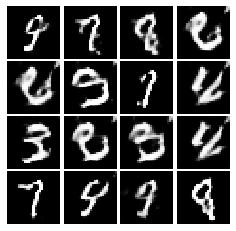

Epoch: 4, Iter: 1940, D: 0.9151, G:2.285


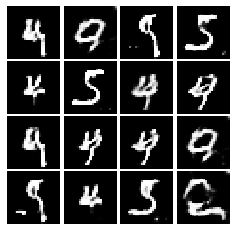

Epoch: 4, Iter: 1960, D: 0.3543, G:3.377


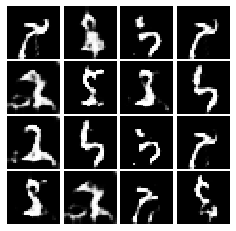

Epoch: 4, Iter: 1980, D: 0.2553, G:1.572


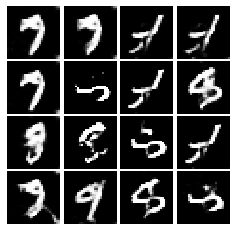

Epoch: 4, Iter: 2000, D: 0.92, G:1.684


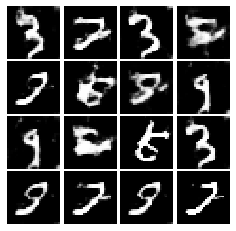

Epoch: 4, Iter: 2020, D: 0.3549, G:2.415


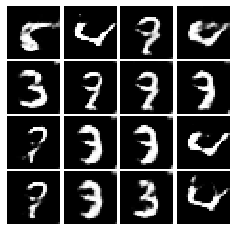

Epoch: 4, Iter: 2040, D: 0.4767, G:3.111


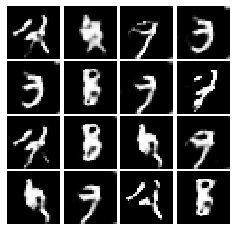

Epoch: 4, Iter: 2060, D: 0.5838, G:2.972


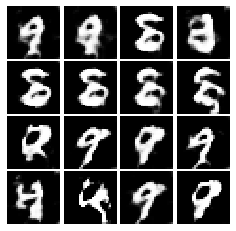

Epoch: 4, Iter: 2080, D: 0.5302, G:3.761


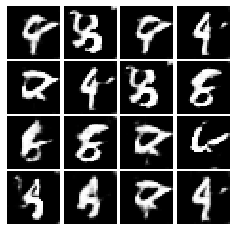

Epoch: 4, Iter: 2100, D: 0.214, G:2.908


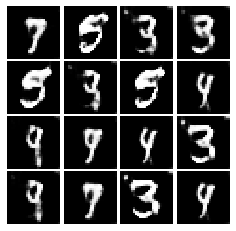

Epoch: 4, Iter: 2120, D: 0.3039, G:3.783


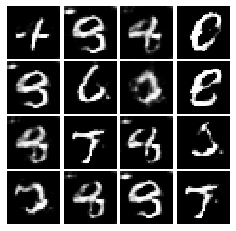

Epoch: 4, Iter: 2140, D: 0.6094, G:2.485


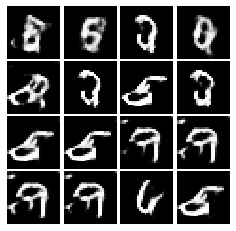

Epoch: 4, Iter: 2160, D: 0.7625, G:2.405


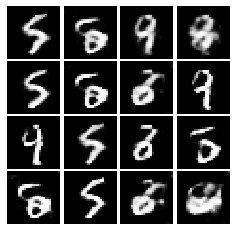

Epoch: 4, Iter: 2180, D: 0.5857, G:3.183


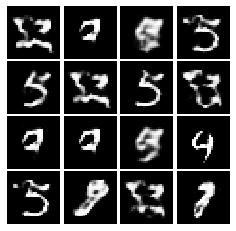

Epoch: 4, Iter: 2200, D: 0.5437, G:2.398


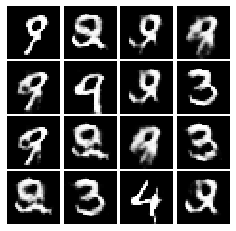

Epoch: 4, Iter: 2220, D: 0.4872, G:2.775


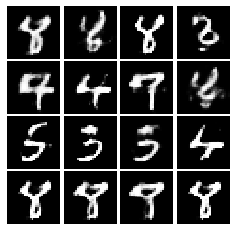

Epoch: 4, Iter: 2240, D: 0.6139, G:4.191


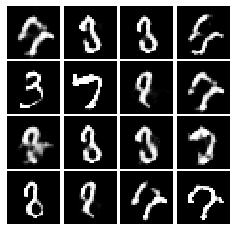

Epoch: 4, Iter: 2260, D: 0.2058, G:3.913


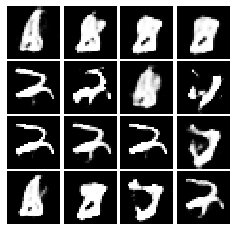

Epoch: 4, Iter: 2280, D: 0.3911, G:4.574


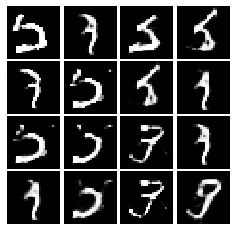

Epoch: 4, Iter: 2300, D: 0.3034, G:3.704


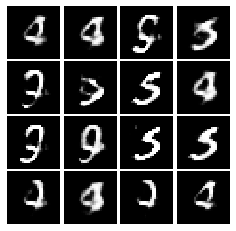

Epoch: 4, Iter: 2320, D: 0.3219, G:5.038


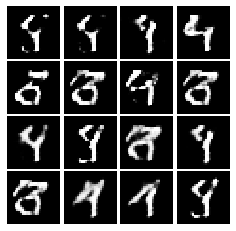

Epoch: 4, Iter: 2340, D: 0.8689, G:4.321


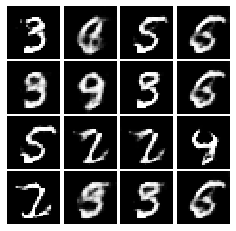

Final images


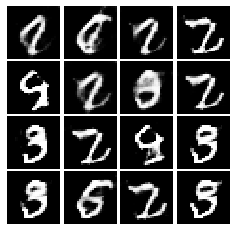

In [23]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)